In [1]:
# imports

# Models
from sklearn.base import BaseEstimator, TransformerMixin

from xgboost import XGBClassifier
from lightgbm import LGBMClassifier as lgbm
from sklearn.svm import SVC
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import GaussianNB
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier
from sklearn.decomposition import PCA

# pipelines
from sklearn.pipeline import Pipeline
from sklearn.pipeline import make_pipeline
from imblearn.pipeline import Pipeline as PipeIMBL

# preprocessors
from sklearn.preprocessing import StandardScaler, LabelEncoder, MinMaxScaler, normalize
from sklearn.feature_selection import chi2, f_classif, mutual_info_classif, SelectKBest, SelectFromModel, RFE

# Samplers
from imblearn.combine import SMOTEENN, SMOTETomek
from imblearn.over_sampling import SMOTE

# metrics and splitters
from sklearn.metrics import f1_score
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, roc_auc_score

from sklearn.model_selection import StratifiedKFold, GridSearchCV, RandomizedSearchCV
from sklearn.model_selection import train_test_split

# utils
from sklearn.utils.validation import check_is_fitted
from sklearn.utils.class_weight import compute_class_weight
from sklearn.model_selection import ParameterGrid
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import pickle
import sys
import matplotlib_venn as venn
import json

import upsetplot as uplt
import vae_utils
# progress bar
from ipywidgets import IntProgress
from IPython.display import display

sys.path.append("../")

import AtlasAnalysisFunctions as AAF
import utils_ML as uml

import shap
shap.initjs()
plt.style.use('seaborn-dark')

In [2]:
import mysql.connector

conn = mysql.connector.connect(user='root', password='password', host='127.0.0.1', port='3306',database='expression_atlas_cells')
mycursor = conn.cursor(buffered = True)

# check the connection
if conn.is_connected():
    print("connection succesfull")
else:
    print("no connection")

seqsql = "SELECT protein.uniprot_id, protein.description FROM protein WHERE length IS NOT NULL"
uniprot_description = pd.read_sql_query(seqsql, conn)
uniprot_description.description = uniprot_description.description.apply(lambda x: x.split("(")[0])
uniprot_description = uniprot_description.set_index("uniprot_id")

connection succesfull


In [11]:
# read data

colors = sns.color_palette("bright")+sns.color_palette("pastel")
colors = colors[:15]

data = pd.read_csv("../preprocessing/quantile_norm_NSAF_50.csv", index_col = "assay_id")
with open("/home/compomics/Sam/git/python/master_thesis/Atlas_analysis/preprocessing/selected_features.txt", "r") as f:
    features = f.readlines()
    features = [x.strip() for x in features]
data = data.loc[:, features]
meta = pd.read_csv("../../Metadata/unified_metadata.csv")
meta = meta[meta.assay_id.isin(data.index)]

groups = pd.read_csv("../../Metadata/group_cells_annotation.csv", sep =";", index_col="Unnamed: 0")
meta["Group"] = meta.cell_line.apply(lambda x: groups[groups.cell_line == x]["group"].values[0])
meta = meta.set_index("assay_id")

data.sort_index(inplace=True)
meta.sort_index(inplace=True)

target_encoder = LabelEncoder()
targets = target_encoder.fit_transform(meta.Group)
unique_labels = pd.Series(targets).unique()

class_weights = compute_class_weight(class_weight='balanced', classes=unique_labels, y=targets)

weights = {unique_labels[i]: class_weights[i] for i in range(len(unique_labels))}
print(weights)

{2: 2.6564102564102563, 9: 0.7194444444444444, 11: 1.3282051282051281, 3: 2.3022222222222224, 1: 0.3453333333333333, 7: 3.453333333333333, 5: 1.4388888888888889, 0: 0.4427350427350427, 8: 1.5014492753623188, 12: 1.4388888888888889, 10: 1.3282051282051281, 6: 0.5755555555555556, 13: 1.817543859649123, 14: 3.453333333333333, 4: 0.8222222222222222}


In [12]:
feature_names = data.columns
dataset = data.reset_index(drop=True).rename(columns={data.columns[x]:x for x in range(len(data.columns))})

In [15]:
# Impute and scale
imputer = uml.LowestValueImputerGaussian()
dataset = imputer.fit_transform(dataset,targets)
dataset = MinMaxScaler().fit_transform(dataset)

# Split dataset
X_train, X_test, y_train, y_test = train_test_split(dataset, targets,
                                                    stratify=targets, 
                                                    test_size=0.20,
                                                    random_state=42)

# Init
smote = SMOTE()
#vae = vae_utils.VariationalAutoencoder(6, 161, 50)
#vae.load_state_dict(torch.load("/home/compomics/Sam/git/python/master_thesis/Atlas_analysis/preprocessing/VAE_model_filtered"))

lr_smote = LogisticRegression(max_iter=10000, C=50, solver="liblinear", penalty="l2")
svc_smote = SVC(C=15, kernel="rbf", probability=True)
rf_smote = RandomForestClassifier(n_estimators = 150, criterion="entropy", max_depth = 10)

# Oversample
smote_oversampled, y_oversampled = smote.fit_resample(X_train, y_train)
#vae_oversampled, y_vae = vae_utils.resampleVAE(vae, X_train.to_numpy().astype("float32"), list(y_train), 10)

# Fit
lr_smote.fit(smote_oversampled, y_oversampled)
svc_smote.fit(smote_oversampled, y_oversampled)
rf_smote.fit(smote_oversampled, y_oversampled)

Y_pred_lr_smote = lr_smote.predict(X_test)
Y_pred_svc_smote = svc_smote.predict(X_test)
Y_pred_rf_smote = rf_smote.predict(X_test)

Text(252.5, 0.5, 'True label')

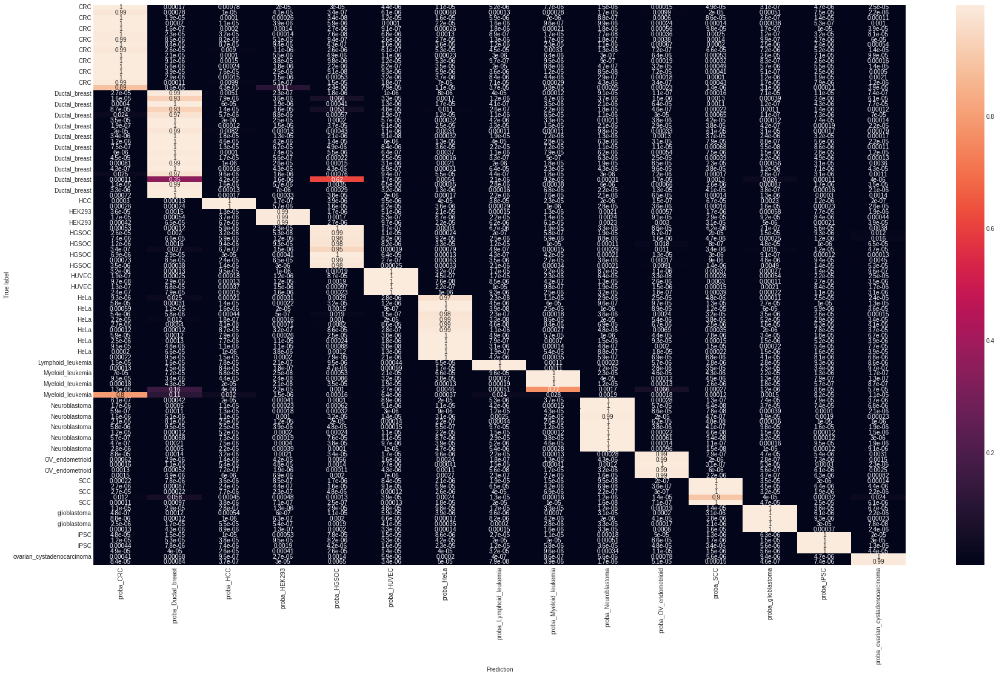

In [17]:
predictions_lr = pd.DataFrame({'prediction': target_encoder.inverse_transform(Y_pred_lr_smote), 'label': target_encoder.inverse_transform(y_test)})
predictions_lr["correct"] = predictions_lr.apply(lambda x: True if x["prediction"] == x["label"] else False, axis=1)
proba_predictions_lr = lr_smote.predict_proba(X_test)
predictions_lr = pd.concat([predictions_lr, pd.DataFrame(proba_predictions_lr, columns = ['proba_'+x for x in target_encoder.inverse_transform(lr_smote.classes_)])], axis = 1)
fig = plt.figure(figsize=(30,17))

s = sns.heatmap(predictions_lr.set_index('label').sort_index().iloc[:,2:], annot = True)
s.set_xlabel('Prediction')
s.set_ylabel('True label')

In [4]:
shap_lr_test = np.load("./shap_values/cpu_lr_test")
shap_lr_train = np.load("./shap_values/cpu_lr_train")
shap_svc_test = np.load("./shap_values/cpu_svc_test")
shap_svc_train = np.load("./shap_values/cpu_svc_train")
shap_rf_test = np.load("./shap_values/cpu_rf_test")
shap_rf_train = np.load("./shap_values/cpu_rf_train")

with open("./shap_values/cpu_features_uniprot.json", "r") as feature_file:
    features = list(json.load(feature_file).values())[0]

In [55]:
pd.Series(y_test)[target_encoder.inverse_transform(y_test) == "SCC"]

17    11
41    11
68    11
70    11
dtype: int64

In [139]:
axes_SCC = X_train.reset_index()[X_train.reset_index()["assay_id"].isin(meta[meta.Group == "SCC"].index)]["assay_id"]

In [146]:
treatment_ = axes_SCC.reset_index().merge(meta.reset_index(), on = "assay_id")
treatment_axes = treatment_[treatment_.treatment != "/"]["index"].tolist()
non_treatment_axes = treatment_[treatment_.treatment == "/"]["index"].tolist()

In [161]:
treated_df = pd.DataFrame(shap_svc_train[11][[treatment_axes]], columns=features).mean().rename("Treated").reset_index().set_index("index")
untreated_df = pd.DataFrame(shap_svc_train[11][[non_treatment_axes]], columns=features).mean().rename("Untreated").reset_index().set_index("index")

Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.


In [166]:
summaries_svc[11]

,SHAP_mean,Abundance_rank,Abundance_mean,Abundance_std,description
P08670,0.023335,1.0,0.000000,0.000000,Vimentin
Q8WUF5,0.020709,15.0,0.872545,0.079138,RelA-associated inhibitor
P46821,0.018432,1.0,0.015705,0.073665,Microtubule-associated protein 1B
Q14151,0.017961,2.0,0.036991,0.173501,Scaffold attachment factor B2
P80723,0.016840,1.0,0.000000,0.000000,Brain acid soluble protein 1
P48681,0.015906,1.0,0.000000,0.000000,Nestin
P16144,0.014999,14.0,0.728770,0.085607,Integrin beta-4
Q14116,0.014844,15.0,0.836407,0.068591,Interleukin-18
Q9BTT6,0.014480,14.0,0.739723,0.267460,Leucine-rich repeat-containing protein 1
Q9Y446,0.014020,13.0,0.769928,0.057172,Plakophilin-3


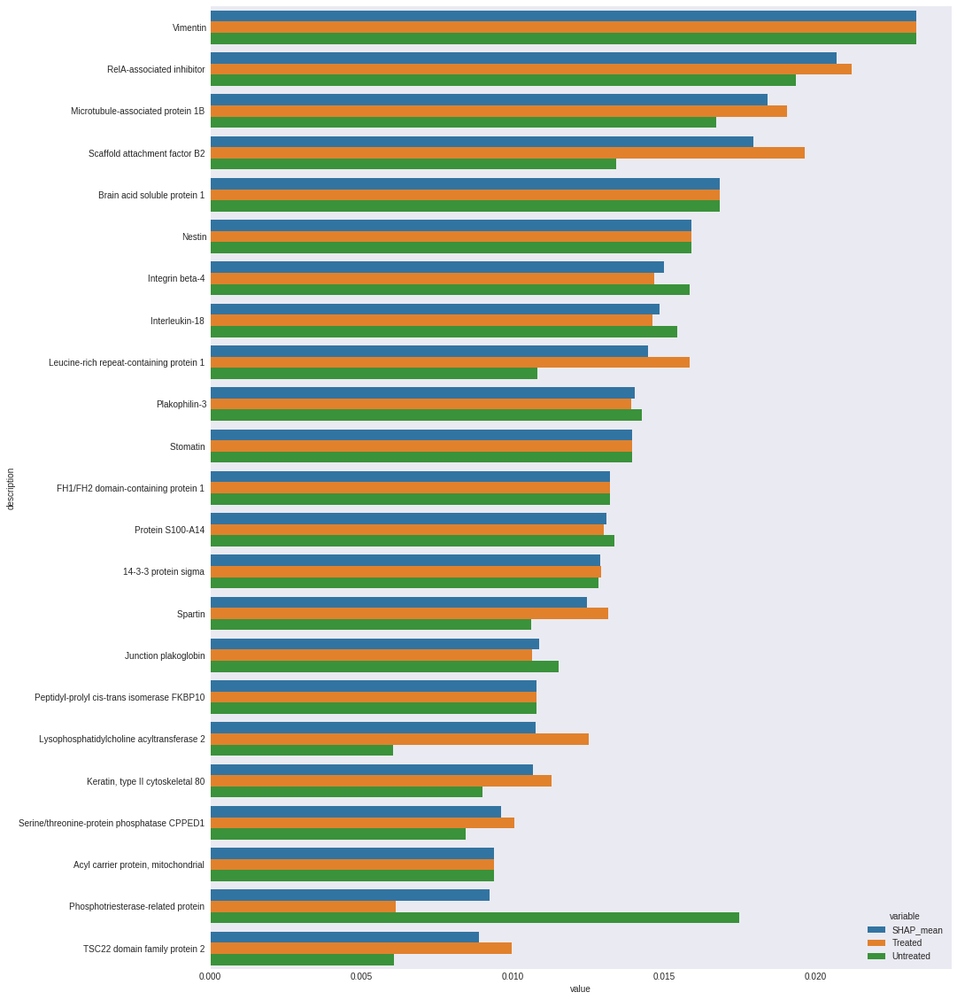

In [165]:
diff_treatment = pd.concat([summaries_svc[11], treated_df.loc[SCC], untreated_df.loc[SCC]],
            axis=1)

            
plt.figure(figsize=(15,20))
sns.barplot(data=diff_treatment.melt(id_vars=("description"), value_vars=("SHAP_mean", "Treated", "Untreated")), y="description", x="value", hue="variable")

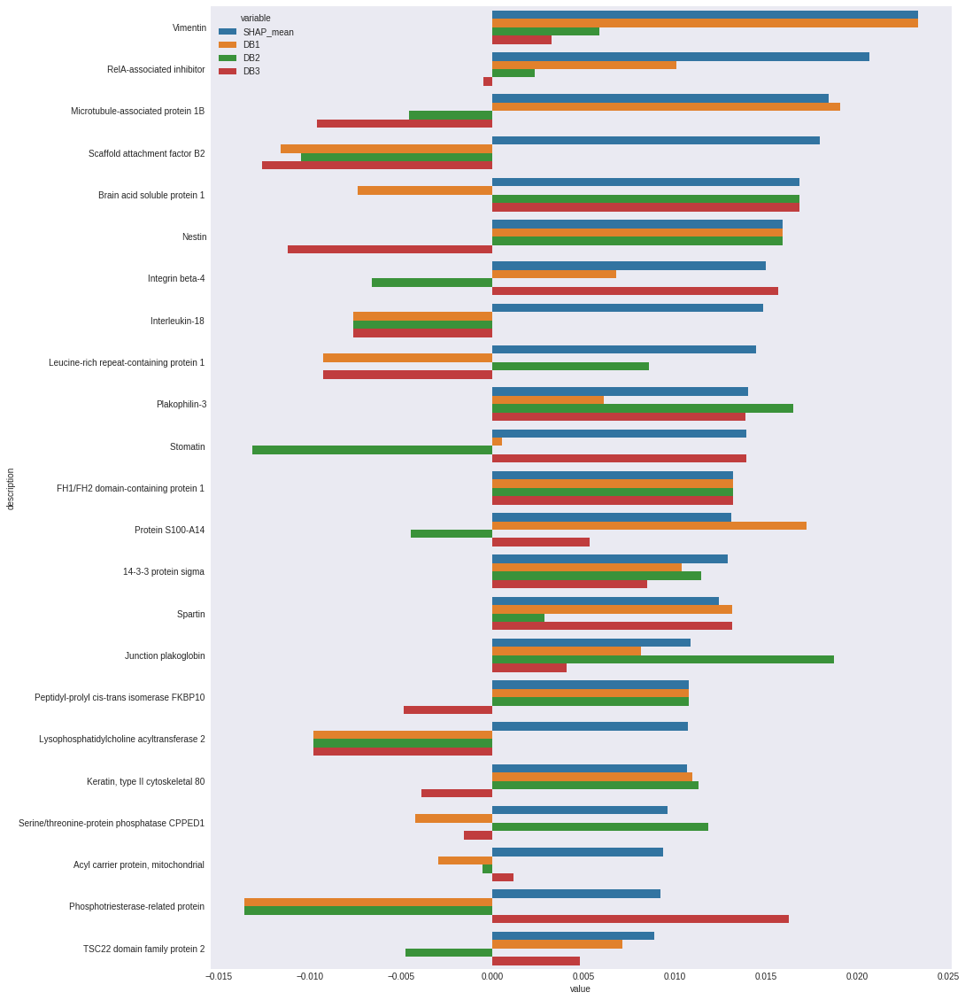

In [121]:
test_eval_duct = pd.concat([summaries_svc[11], pd.DataFrame(shap_svc_train[11][[10,368,413]], columns=features).loc[:,SCC].T], axis=1).rename(columns={0: 'DB1', 1: 'DB2', 2:'DB3'})

plt.figure(figsize=(15,20))
sns.barplot(data=test_eval_duct.melt(id_vars=("description"), value_vars=("SHAP_mean", "DB1", "DB2", "DB3")), y="description", x="value", hue="variable")

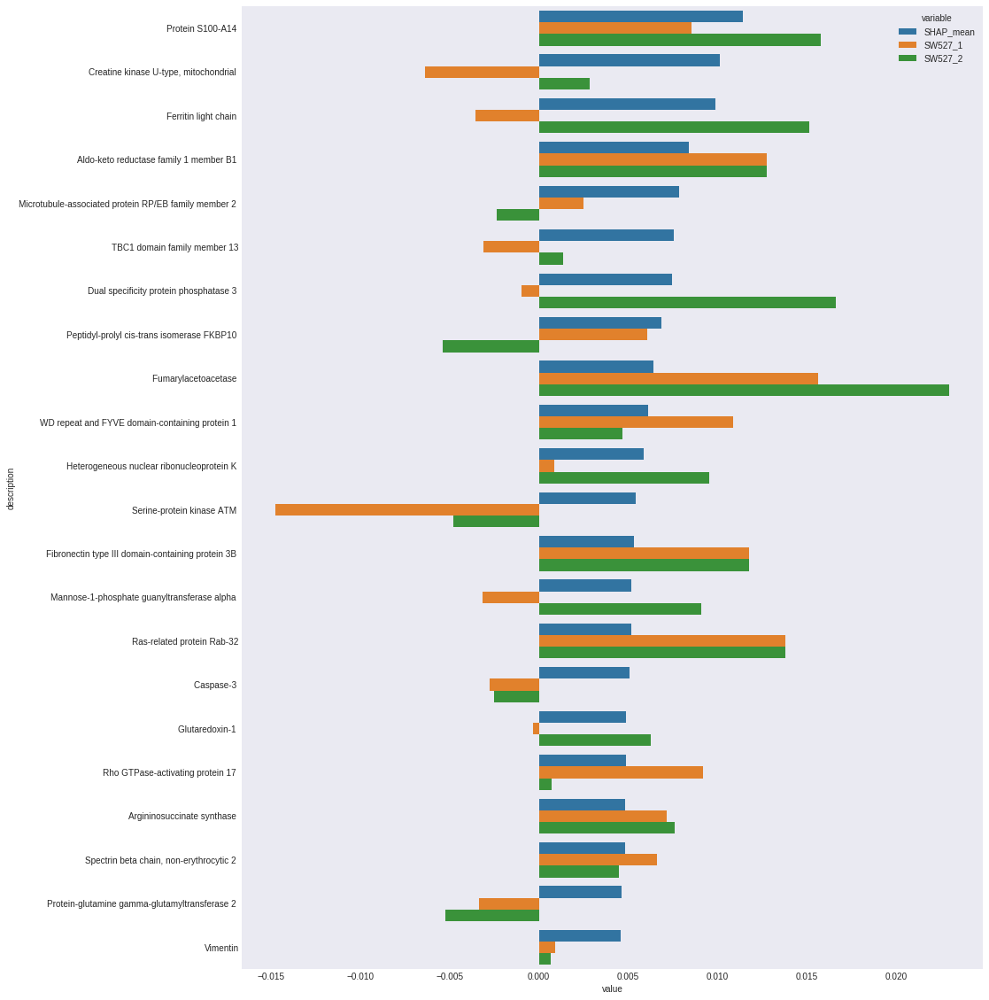

In [108]:
test_eval_duct = pd.concat([summaries_svc[1], pd.DataFrame(shap_svc_train[1][[188,204]], columns=features).loc[:,Ductal].T], axis=1).rename(columns={0: 'SW527_1', 1: 'SW527_2'})

plt.figure(figsize=(15,20))
sns.barplot(data=test_eval_duct.melt(id_vars=("description"), value_vars=("SHAP_mean", "SW527_1", "SW527_2")), y="description", x="value", hue="variable")

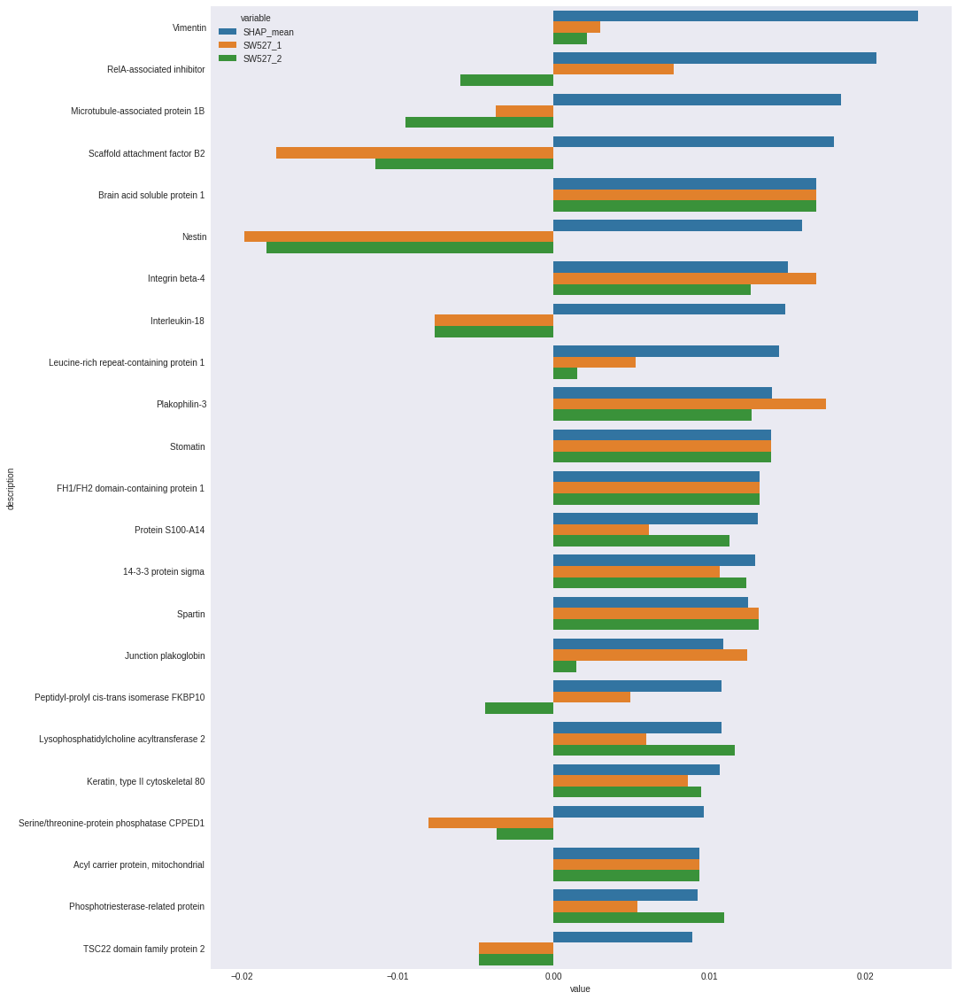

In [110]:
test_eval_SCC = pd.concat([summaries_svc[11], pd.DataFrame(shap_svc_train[11][[188,204]], columns=features).loc[:,SCC].T], axis=1).rename(columns={0: 'SW527_1', 1: 'SW527_2'})
plt.figure(figsize=(15,20))
sns.barplot(data=test_eval_SCC.melt(id_vars=("description"), value_vars=("SHAP_mean", "SW527_1", "SW527_2")), y="description", x="value", hue="variable")

In [5]:
X_train, X_test, y_train, y_test = train_test_split(data, targets,
                                                    stratify=targets, 
                                                    test_size=0.15,
                                                    random_state=42)

y_train_df = pd.Series(y_train)

preprocessor_cpu = Pipeline(steps=[
    ('filtering', uml.FilterByOccurence(.5)),
    ('imputer', uml.LowestValueImputer()),
    ('scaler', MinMaxScaler())
])

# First preprocessor (global filter)
preprocessor_cpu.fit(X_train, y_train)
X_train_processed_cpu = preprocessor_cpu.transform(X_train)
X_test_processed_cpu = preprocessor_cpu.transform(X_test)

X_train_processed_cpu = pd.DataFrame(X_train_processed_cpu, columns= preprocessor_cpu.named_steps.filtering.filtered_proteins)
X_test_processed_cpu = pd.DataFrame(X_test_processed_cpu, columns= preprocessor_cpu.named_steps.filtering.filtered_proteins)

X_train_processed_cpu = X_train_processed_cpu.loc[:, features]
X_test_processed_cpu = X_test_processed_cpu.loc[:, features]

In [6]:
with open("GO_C_uniprot_map.json", 'r') as f:
    uniprot_go_compartment = json.load(f)

with open("GO_F_uniprot_map.json", 'r') as f:
    uniprot_go_function = json.load(f)

with open("GO_P_uniprot_map.json", 'r') as f:
    uniprot_go_process = json.load(f)

In [133]:
GO_description = pd.read_csv("../annotation_files/go_description.txt", sep="\t", index_col="GO_ID")

In [215]:
C_GO_prots = list(uniprot_go_compartment.keys())
F_GO_prots = list(uniprot_go_function.keys())
P_GO_prots = list(uniprot_go_process.keys())

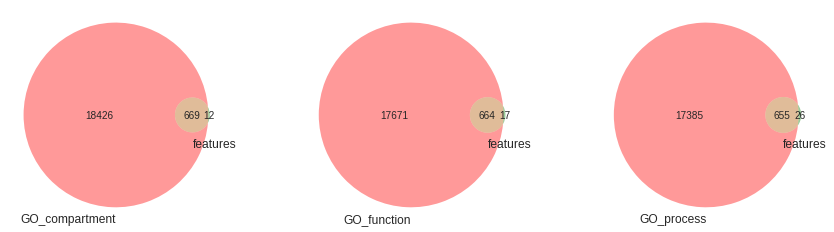

In [217]:
fig, ax = plt.subplots(1,3, figsize=(15,4))

venn.venn2(subsets=(set(C_GO_prots), set(features)), set_labels=("GO_compartment", "features"), ax=ax[0])
venn.venn2(subsets=(set(F_GO_prots), set(features)), set_labels=("GO_function", "features"), ax = ax[1])
venn.venn2(subsets=(set(P_GO_prots), set(features)), set_labels=("GO_process", "features"), ax = ax[2])

In [218]:
def return_missing_ontology(go_prots):
    missing_ontology = []
    for p in features:
        if p not in go_prots:
            missing_ontology.append(p)
    return missing_ontology

In [219]:
missing_ontology_C = return_missing_ontology(C_GO_prots)
uniprot_description.loc[missing_ontology_C,:]

,description
uniprot_id,
E9PRG8,Uncharacterized protein C11orf98
L0R6Q1,SLC35A4 upstream open reading frame protein
O75157,TSC22 domain family protein 2
P42167,"Lamina-associated polypeptide 2, isoforms beta..."
P51397,Death-associated protein 1
Q3KQV9,UDP-N-acetylhexosamine pyrophosphorylase-like ...
Q7Z4H3,5'-deoxynucleotidase HDDC2
Q8WZA0,Protein LZIC
Q8WZA9,Immunity-related GTPase family Q protein


In [220]:
missing_ontology_F = return_missing_ontology(F_GO_prots)
uniprot_description.loc[missing_ontology_F,:]

,description
uniprot_id,
E9PRG8,Uncharacterized protein C11orf98
L0R6Q1,SLC35A4 upstream open reading frame protein
O00461,Golgi integral membrane protein 4
O75157,TSC22 domain family protein 2
P42167,"Lamina-associated polypeptide 2, isoforms beta..."
P43121,Cell surface glycoprotein MUC18
P84157,Matrix-remodeling-associated protein 7
Q14146,Unhealthy ribosome biogenesis protein 2 homolog
Q56VL3,OCIA domain-containing protein 2


In [221]:
missing_ontology_P = return_missing_ontology(P_GO_prots)
uniprot_description.loc[missing_ontology_P,:]

,description
uniprot_id,
E9PRG8,Uncharacterized protein C11orf98
L0R6Q1,SLC35A4 upstream open reading frame protein
O00461,Golgi integral membrane protein 4
P42166,"Lamina-associated polypeptide 2, isoform alpha"
P42167,"Lamina-associated polypeptide 2, isoforms beta..."
P84157,Matrix-remodeling-associated protein 7
Q07065,Cytoskeleton-associated protein 4
Q3YEC7,Rab-like protein 6
Q53EP0,Fibronectin type III domain-containing protein...


In [77]:
GO_per_assay = {}
for i, row in X_train_processed_cpu.iterrows():
    GO_per_assay[i] = []
    for prot_id, val in enumerate(row):
        if features[prot_id] not in missing_ontology:
            if val != 0:
                GO_per_assay[i] += uniprot_go_compartment[features[prot_id]]

used_GOS = []
for i, GOS in GO_per_assay.items():
    used_GOS += GOS
used_GOS = list(set(used_GOS))

f = IntProgress(min=0, max= 440) 
display(f)

dict_to_df = {}
for i, assay_GOS in GO_per_assay.items():
    row = []
    for GO in used_GOS:
        row.append(assay_GOS.count(GO))
    dict_to_df[i] = np.array(row)
    f.value += 1

GO_assay_df = pd.DataFrame(dict_to_df, index=used_GOS).T

differences = []
for go in GO_assay_df.columns:
    if len(GO_assay_df.loc[:, go].value_counts()) != 1:
        differences.append(go)
GO_assay_df = GO_assay_df.loc[:,differences]

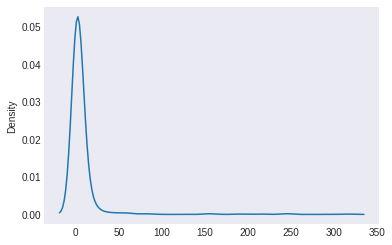

In [86]:
sns.kdeplot(GO_assay_df.max())

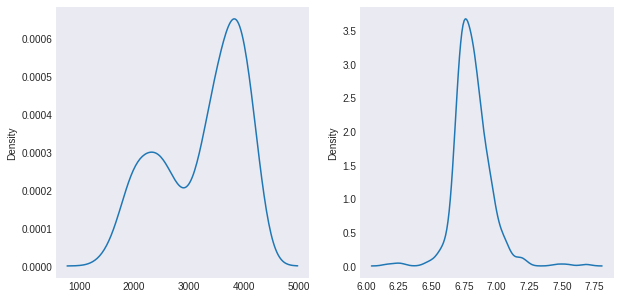

In [142]:
GO_assay_df = GO_assay_df.rename(columns = {col: GO_description.loc[col].annotation_label for col in GO_assay_df.columns})

# Needs normalization
fig,(ax1,ax2) = plt.subplots(1,2,figsize=(10,5))
sns.kdeplot(GO_assay_df.sum(axis=1),ax=ax1)
normalized_GO_assay_df = normalize(GO_assay_df)
normalized_GO_assay_df = pd.DataFrame(normalized_GO_assay_df, columns = GO_assay_df.columns, index=GO_assay_df.index)
sns.kdeplot(normalized_GO_assay_df.sum(axis=1),ax=ax2)

In [143]:
abundant_C_GOs = GO_assay_df.columns[GO_assay_df.max() > 50]

In [102]:
y_train_color_map = y_train_df.reset_index(name = "Y_label")
y_train_color_map['colors'] = y_train_color_map.Y_label.apply(lambda x: colors[x])

In [96]:
y_train_df = y_train_df[0:440]

In [121]:
labels, lut = [], []
for i, row in y_train_color_map["Y_label colors".split()].drop_duplicates().iterrows():
    labels.append(target_encoder.inverse_transform([row["Y_label"]])[0])
    lut.append(row["colors"])

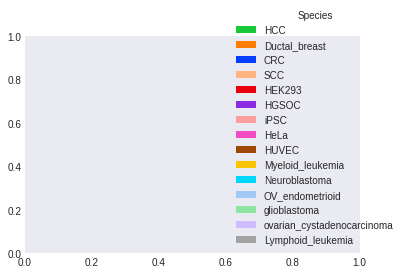

In [125]:
handles = [Patch(facecolor=c) for c in lut]
plt.legend(handles, labels, title='Species',
           bbox_to_anchor=(1, 1), bbox_transform=plt.gcf().transFigure, loc='upper right')

plt.legend(handles, labels, title='Species',
           bbox_to_anchor=(1, 1), bbox_transform=plt.gcf().transFigure, loc='upper right')

In [148]:
normalized_GO_assay_df.std().sort_values(ascending=False)[:20]

nucleoplasm                        0.043357
nucleolus                          0.029253
extracellular exosome              0.026626
nucleus                            0.023744
plasma membrane                    0.020752
cytoplasm                          0.019097
cytosol                            0.018721
membrane                           0.018695
endoplasmic reticulum membrane     0.014453
extracellular region               0.014062
focal adhesion                     0.013953
endoplasmic reticulum              0.011773
extracellular space                0.011681
mitochondrion                      0.011355
nuclear speck                      0.011141
chromosome                         0.010034
chromatin                          0.009879
cell surface                       0.009489
cytoskeleton                       0.009112
perinuclear region of cytoplasm    0.008569
dtype: float64

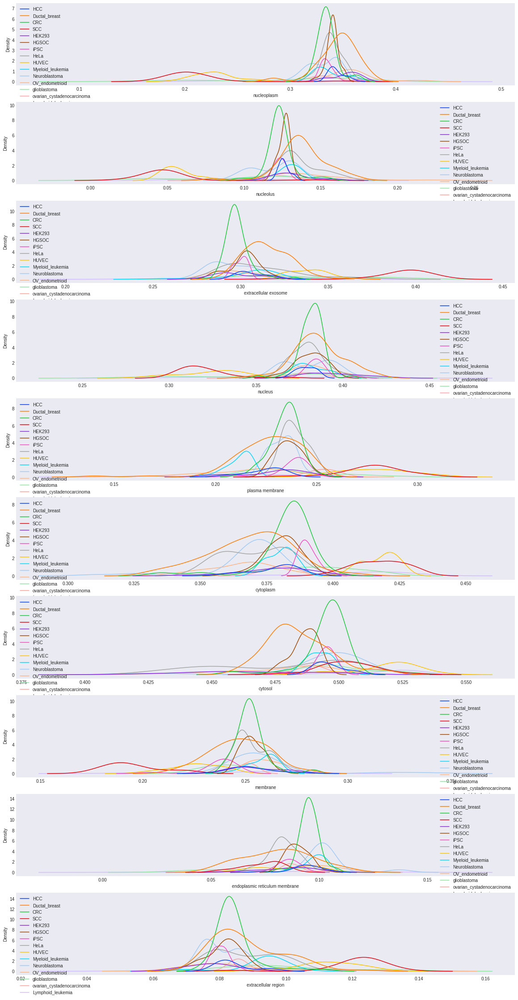

In [162]:
fig,ax = plt.subplots(10,1,figsize=(20,40))
for i, x in enumerate(normalized_GO_assay_df.std().sort_values(ascending=False)[:10].index):
    sns.kdeplot(normalized_GO_assay_df.loc[:,x], hue = target_encoder.inverse_transform(y_train_color_map["Y_label"].tolist()), palette = colors, ax = ax[i])

<Figure size 1440x720 with 0 Axes>

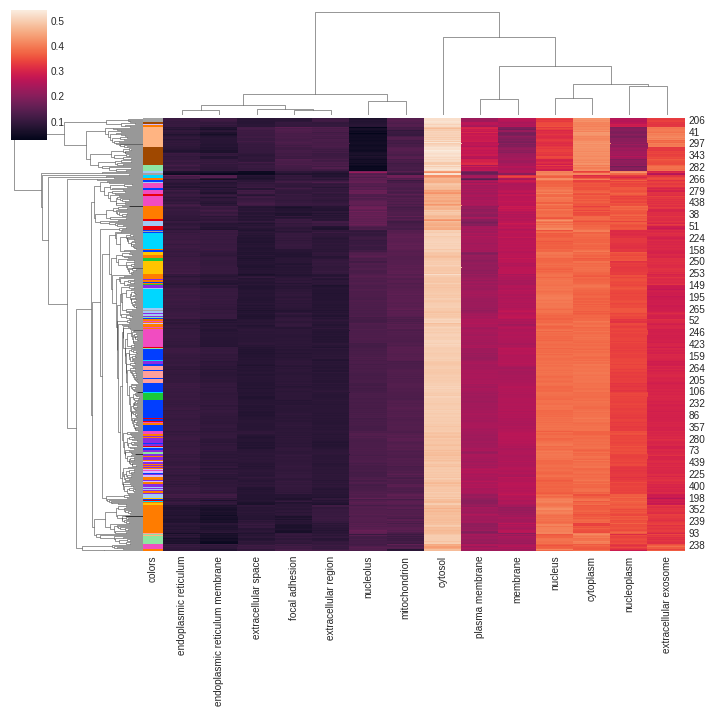

In [144]:
from matplotlib.patches import Patch

plt.figure(figsize=(20,10))
sns.clustermap(normalized_GO_assay_df.loc[:,abundant_C_GOs], row_colors=y_train_color_map["colors"])

In [13]:
abundance_df = pd.DataFrame(index=features)
abundance_df_std = pd.DataFrame(index=features)

for i in range(15):

    abundance_df[target_encoder.inverse_transform([i])[0] + '_mean'] = X_train_processed_cpu.loc[y_train == i,:].mean()
    abundance_df_std[target_encoder.inverse_transform([i])[0] + '_std'] = X_train_processed_cpu.loc[y_train == i,:].std()
rank_df = abundance_df.rank(axis=1).rename(columns={x+"_mean":x+"_rank" for x in target_encoder.inverse_transform(range(15))})

# LR

The shaps are a lot 0 due to L1 regularization

In [10]:
def rank_plot_shap(shaps):
    fig, ax = plt.subplots(3,5, figsize=(35,15))

    y_axis = 0
    x_axis = 0
    for i in range(15):
        
        # Get the table of shap values for class i
        shaps_df = pd.DataFrame(shaps[i], columns=features)

        # Create dataframe with mean and std of the shap values for the test_samples corresponding to that class 
        stat_shaps_df = pd.DataFrame(shaps_df.loc[y_train_df == i,:].mean(), columns = ["mean"])
        stat_shaps_df["std"] = shaps_df.loc[y_train_df == i,:].std()

        stat_shaps_df = stat_shaps_df["mean"].sort_values().reset_index()
        stat_shaps_df["x_axis"] = list(range(681))

        ax[x_axis][y_axis].set_title(target_encoder.inverse_transform([i]))
        sns.scatterplot(data=stat_shaps_df, x="x_axis", y="mean", ax=ax[x_axis][y_axis])

        # Create cumulative distribution plot of the mean shap value of the proteins to see whether a few proteins have large shap value means for each class
        # This enables to inituitively select top % features based on their shap values
        # ax[x_axis][y_axis].set_title(target_encoder.inverse_transform([i]))
        # sns.ecdfplot(abs(stat_shaps_df['mean']), ax=ax[x_axis][y_axis])

        y_axis += 1
        if y_axis == 5:
            y_axis=0
            x_axis+=1

def get_stats_shap(shaps):
    '''Returns pos_shaps (counts), class_proteins (dict)'''
    pos_shaps_lr = []
    class_proteins_lr = {}
    for i in range(15):
        
        class_name = target_encoder.inverse_transform([i])[0]
        # Get the table of shap values for class i
        shaps_df = pd.DataFrame(shaps[i], columns=features)

        # Create dataframe with mean and std of the shap values for the test_samples corresponding to that class 
        stat_shaps_df = pd.DataFrame(shaps_df.loc[y_train_df == i,:].mean(), columns = ["mean"])
        stat_shaps_df["std"] = shaps_df.loc[y_train_df == i,:].std()

        class_proteins_lr[class_name] = stat_shaps_df.index[stat_shaps_df["mean"] > 0].tolist()
        pos_shaps_lr.append(len(class_proteins_lr[class_name]))

        print(class_name , len(class_proteins_lr[class_name]))
    return pos_shaps_lr, class_proteins_lr

def get_stats_shap_threshold(shaps, std_lower=1.96, std_higher=1.96):
    class_proteins_svc_pos = {}
    class_proteins_svc_neg = {}

    for i in range(15):
        
        class_name = target_encoder.inverse_transform([i])[0]

        # Get the table of shap values for class i
        shaps_df = pd.DataFrame(shaps[i], columns=features)

        # Create dataframe with mean and std of the shap values for the test_samples corresponding to that class 
        stat_shaps_df = pd.DataFrame(shaps_df.loc[y_train_df == i,:].mean(), columns = ["mean"])
        stat_shaps_df["std"] = shaps_df.loc[y_train_df == i,:].std()

        stat_shaps_df = stat_shaps_df["mean"].sort_values().reset_index()
        stat_shaps_df["x_axis"] = list(range(681))
        
        # Get significantly positive shap values (most important features)
        mean_of_means, std_of_means = stat_shaps_df["mean"].mean(), stat_shaps_df["mean"].std()
        threshold_pos = mean_of_means + std_higher*std_of_means
        sign_proteins_pos = stat_shaps_df["index"][stat_shaps_df["mean"] > threshold_pos].tolist()
        class_proteins_svc_pos[class_name] = sign_proteins_pos

        threshold_neg = mean_of_means - std_lower*std_of_means
        sign_proteins_neg = stat_shaps_df["index"][stat_shaps_df["mean"] < threshold_neg].tolist()
        class_proteins_svc_neg[class_name] = sign_proteins_neg

    return class_proteins_svc_pos, class_proteins_svc_neg

def get_df_shap(shaps, label, thresh=False, std_lower=1.96, std_higher=1.96):
    shaps_df = pd.DataFrame(shaps[label], column=features)
    stat_shaps_df = pd.DataFrame(shaps_df.loc[y_train_df == label,:].mean(), columns = ["mean"])

    

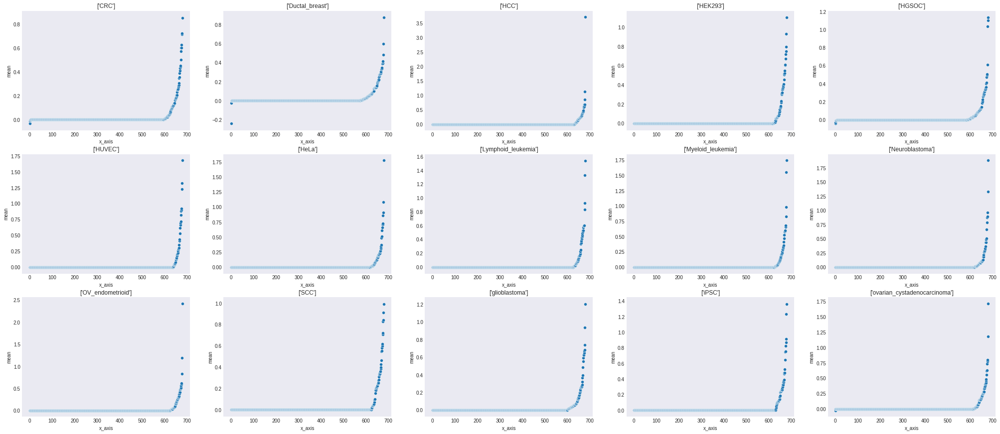

In [6]:
rank_plot_shap(shap_lr_train)

In [10]:
pos_shaps_lr, class_proteins_lr = get_stats_shap(shap_lr_train)

CRC 87
Ductal_breast 115
HCC 52
HEK293 64
HGSOC 95
HUVEC 44
HeLa 62
Lymphoid_leukemia 54
Myeloid_leukemia 56
Neuroblastoma 62
OV_endometrioid 59
SCC 56
glioblastoma 81
iPSC 51
ovarian_cystadenocarcinoma 67


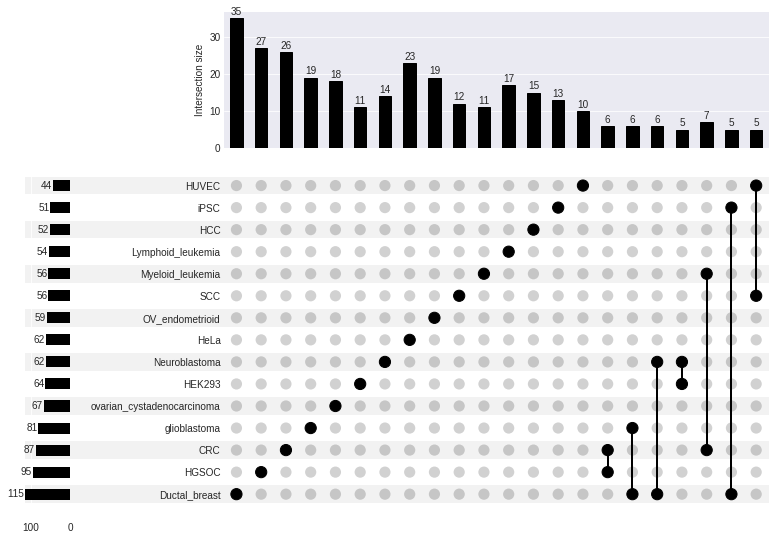

In [119]:
upset_cp = uplt.from_contents(class_proteins_lr)
uplt.UpSet(upset_cp, min_subset_size=5, show_counts=True)

<BarContainer object of 15 artists>

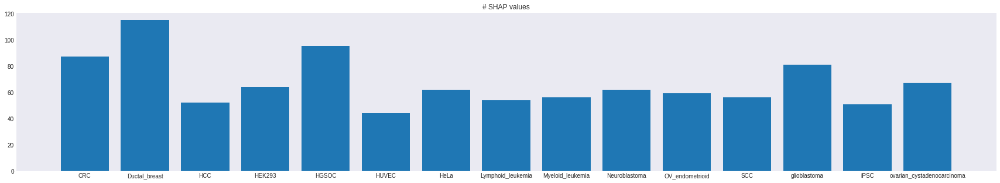

In [120]:
plt.figure(figsize=(30,5))
plt.title("# SHAP values")
plt.bar(x=target_encoder.inverse_transform(range(15)), height= pos_shaps_lr)

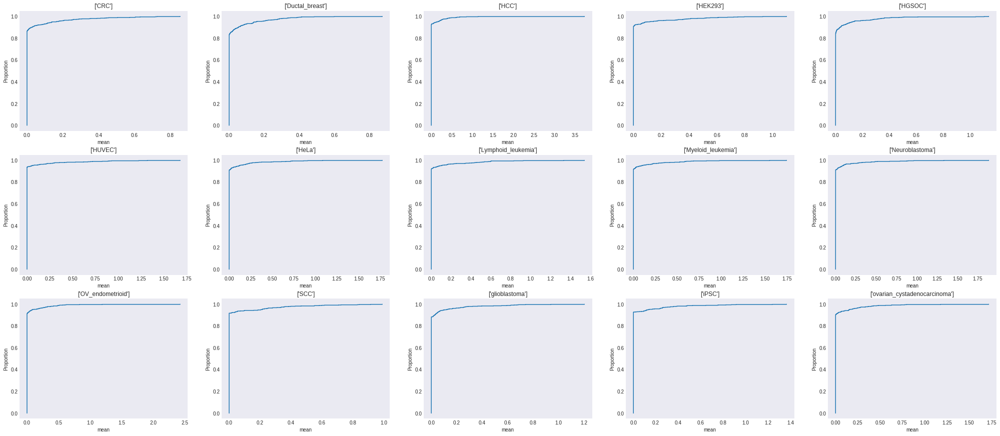

In [15]:
fig, ax = plt.subplots(3,5, figsize=(35,15))

y_axis = 0
x_axis = 0
for i in range(15):
    
    # Get the table of shap values for class i
    shaps_df = pd.DataFrame(shap_lr_train[i], columns=features)

    # Create dataframe with mean and std of the shap values for the test_samples corresponding to that class 
    stat_shaps_df = pd.DataFrame(shaps_df.loc[y_train_df == i,:].mean(), columns = ["mean"])
    stat_shaps_df["std"] = shaps_df.loc[y_train_df == i,:].std()

    # Create cumulative distribution plot of the mean shap value of the proteins to see whether a few proteins have large shap value means for each class
    # This enables to inituitively select top % features based on their shap values
    ax[x_axis][y_axis].set_title(target_encoder.inverse_transform([i]))
    sns.ecdfplot(abs(stat_shaps_df['mean']), ax=ax[x_axis][y_axis])

    y_axis += 1
    if y_axis == 5:
        y_axis=0
        x_axis+=1

# SVC

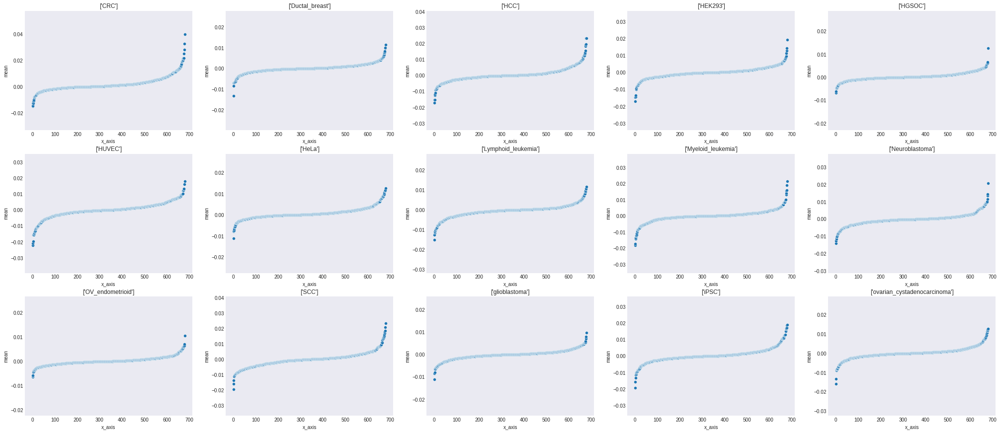

In [122]:
rank_plot_shap(shap_svc_train)

In [11]:
class_proteins_svc_pos, class_proteins_svc_neg = get_stats_shap_threshold(shap_svc_train)

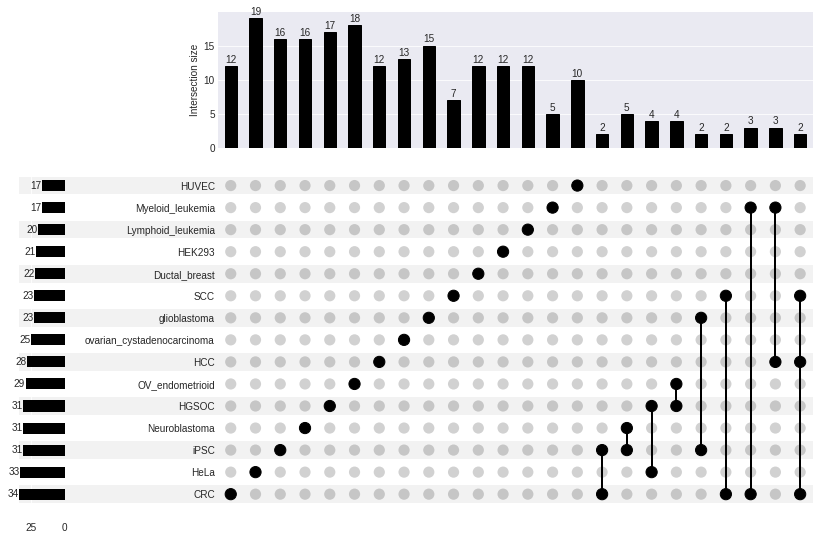

In [124]:
upset_cp_pos = uplt.from_contents(class_proteins_svc_pos)
uplt.UpSet(upset_cp_pos, min_subset_size=2, show_counts=True)

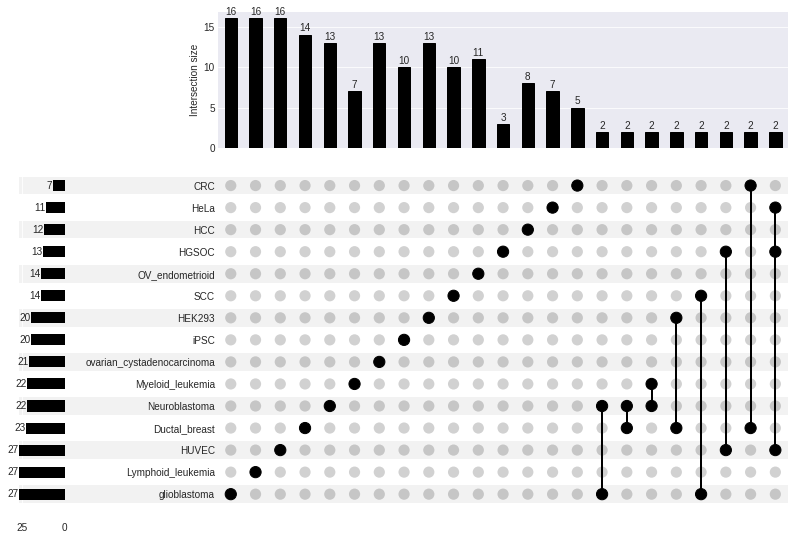

In [125]:
upset_cp_neg = uplt.from_contents(class_proteins_svc_neg)
uplt.UpSet(upset_cp_neg, min_subset_size=2, show_counts=True)

[Text(0, 0, 'CRC'),
 Text(0, 0, 'Ductal_breast'),
 Text(0, 0, 'HCC'),
 Text(0, 0, 'HEK293'),
 Text(0, 0, 'HGSOC'),
 Text(0, 0, 'HUVEC'),
 Text(0, 0, 'HeLa'),
 Text(0, 0, 'Lymphoid_leukemia'),
 Text(0, 0, 'Myeloid_leukemia'),
 Text(0, 0, 'Neuroblastoma'),
 Text(0, 0, 'OV_endometrioid'),
 Text(0, 0, 'SCC'),
 Text(0, 0, 'glioblastoma'),
 Text(0, 0, 'iPSC'),
 Text(0, 0, 'ovarian_cystadenocarcinoma')]

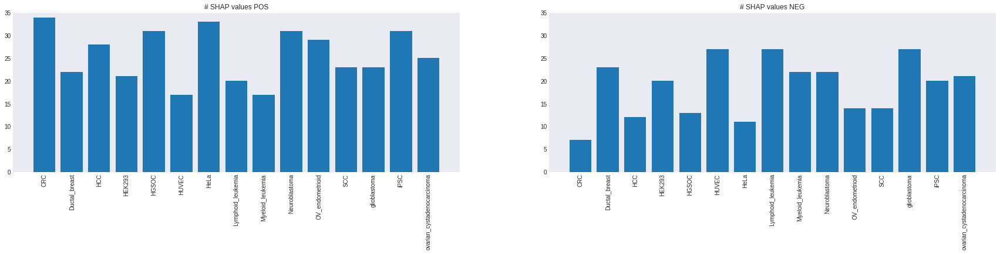

In [131]:
fig, (ax1,ax2) = plt.subplots(1,2, figsize=(30,5))

ax1.set_title("# SHAP values POS")
ax2.set_title("# SHAP values NEG")

ax1.set_ylim((0,35))
ax2.set_ylim((0,35))

ax1.bar(x=target_encoder.inverse_transform(range(15)), height = [len(x) for x in class_proteins_svc_pos.values()])
ax2.bar(x=target_encoder.inverse_transform(range(15)), height = [len(x) for x in class_proteins_svc_neg.values()])

ax1.set_xticklabels(target_encoder.inverse_transform(range(15)), rotation = 90)
ax2.set_xticklabels(target_encoder.inverse_transform(range(15)), rotation = 90)

# RF

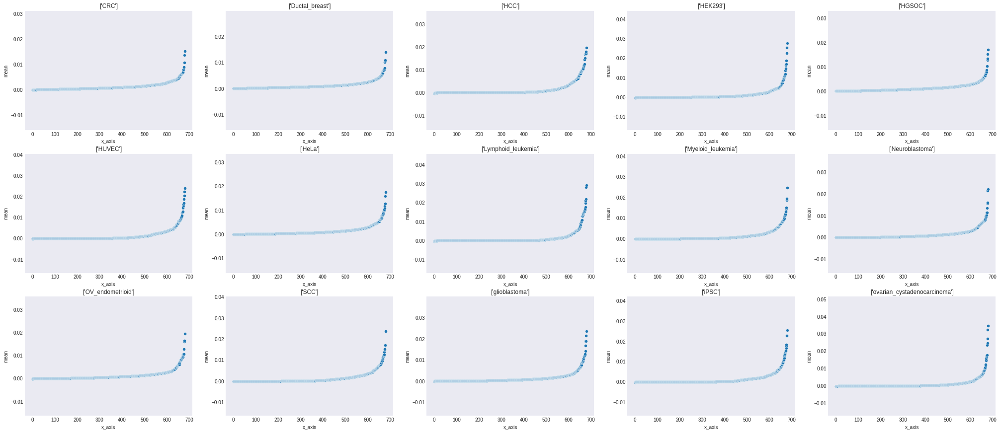

In [132]:
rank_plot_shap(shap_rf_train)

In [12]:
class_proteins_rf_pos, _ = get_stats_shap_threshold(shap_rf_train)

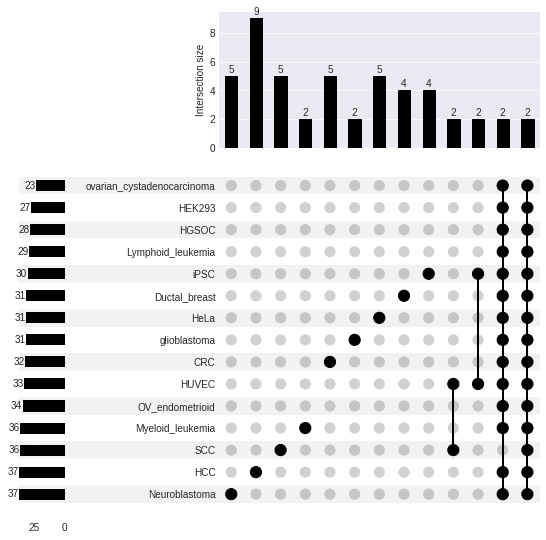

In [145]:
upset_cp_pos = uplt.from_contents(class_proteins_rf_pos)
uplt.UpSet(upset_cp_pos, min_subset_size=2, show_counts=True)

<BarContainer object of 15 artists>

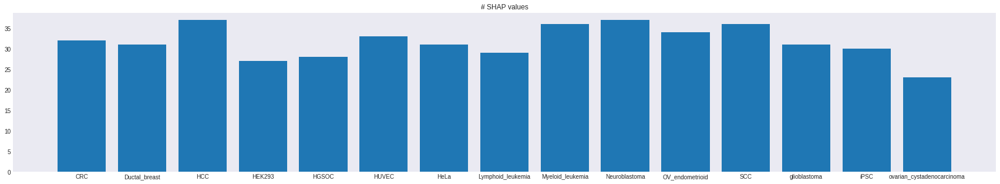

In [146]:
plt.figure(figsize=(30,5))

plt.title("# SHAP values")

plt.bar(x=target_encoder.inverse_transform(range(15)), height = [len(x) for x in class_proteins_rf_pos.values()])

# Overlap of important features per class

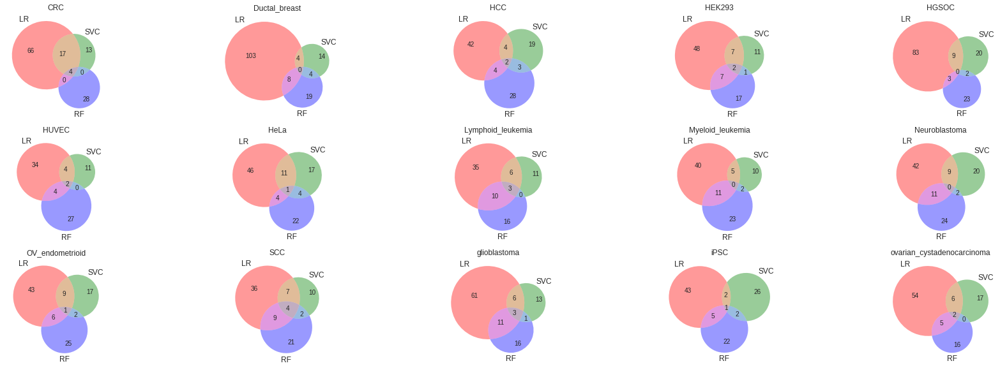

In [10]:
fig, ((ax1,ax2,ax3,ax4,ax5), (ax6,ax7,ax8,ax9,ax10), (ax11,ax12,ax13,ax14,ax15)) = plt.subplots(3,5,figsize=(30,10))

axes = [ax1,ax2,ax3,ax4,ax5, ax6,ax7,ax8,ax9,ax10, ax11,ax12,ax13,ax14,ax15]
for i in range(15):
    class_name = target_encoder.inverse_transform([i])[0]

    lr_features = set(class_proteins_lr[class_name])
    svc_features = set(class_proteins_svc_pos[class_name])
    rf_features = set(class_proteins_rf_pos[class_name])

    axes[i].set_title(class_name)
    venn.venn3(subsets = (lr_features, svc_features, rf_features), set_labels = ('LR', 'SVC', 'RF'), ax=axes[i])

# Plot 10 highest ranking proteins and their abundance

Since LR has the highest score, check certain overrepresented protein interactions are present

Rank: 15 highest, 1 lowest mean abundance of the classes

In [206]:
pd.DataFrame(shaps_df.loc[y_train_df == 0,:].mean(), columns = ["SHAP_mean"])

,SHAP_mean
A0MZ66,0.000000
A6NHL2,-0.015069
A6NHT5,0.000000
A8MXV4,-0.104581
E9PRG8,0.000000
...,...
Q9Y5Z4,0.000000
Q9Y613,0.000000
Q9Y6G9,0.000000
Q9Y6N5,0.000000


In [11]:
def get_summary_df(label, shaps, thresholding=False, threshold_std=1.96, keep_only_enriched=False, hard_threshold=False):    
    
    shaps_df = pd.DataFrame(shaps[label], columns=features)

    stat_shaps_df = pd.DataFrame(shaps_df.loc[y_train_df == label,:].mean(), columns = ["SHAP_mean"])
    stat_shaps_df["Abundance_rank"] = rank_df[target_encoder.inverse_transform([label])[0]+"_rank"]
    stat_shaps_df["Abundance_mean"] = abundance_df.loc[:,target_encoder.inverse_transform([label])[0]+'_mean']
    stat_shaps_df["Abundance_std"] = abundance_df_std.loc[:,target_encoder.inverse_transform([label])[0]+'_std']
    stat_shaps_df["description"] = uniprot_description.loc[stat_shaps_df.index,"description"]
    
    stat_shaps_df = stat_shaps_df.sort_values("SHAP_mean", ascending=False)

    if hard_threshold:
        stat_shaps_df = stat_shaps_df.loc[stat_shaps_df.index[stat_shaps_df["SHAP_mean"] > hard_threshold],:]

    if thresholding:
        mean_of_means, std_of_means = stat_shaps_df["SHAP_mean"].mean(), stat_shaps_df["SHAP_mean"].std()
        threshold_pos = mean_of_means + threshold_std*std_of_means

        stat_shaps_df = stat_shaps_df.loc[stat_shaps_df.index[stat_shaps_df["SHAP_mean"] > threshold_pos],:]

    if keep_only_enriched:
        stat_shaps_df = stat_shaps_df.loc[stat_shaps_df.index[stat_shaps_df["Abundance_rank"] >= 8],:]

    return stat_shaps_df

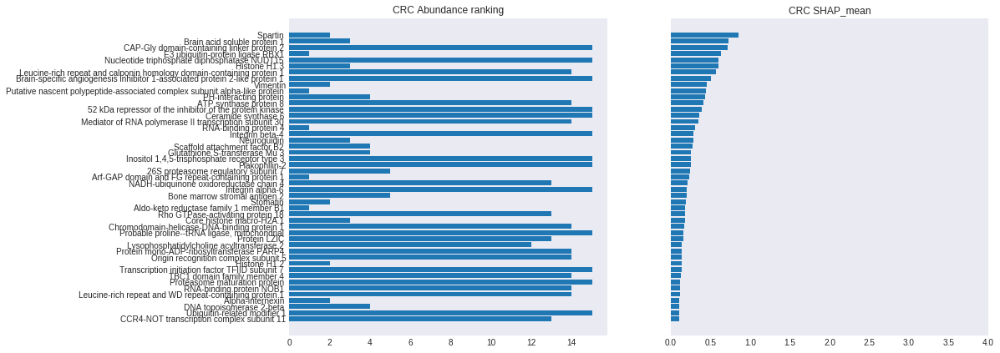

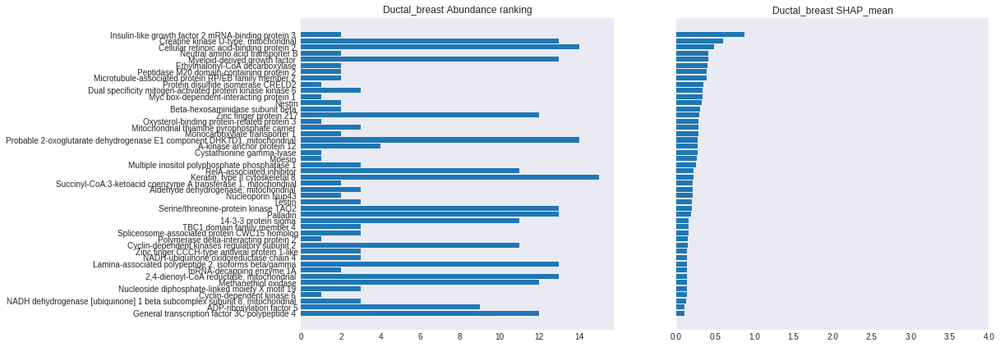

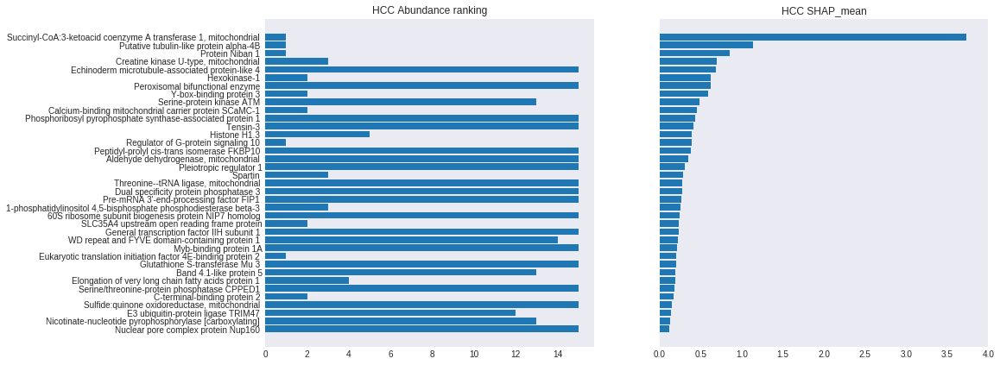

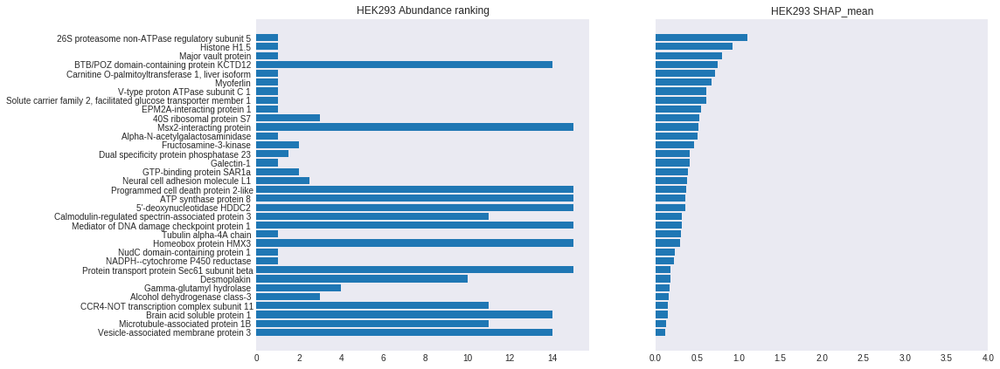

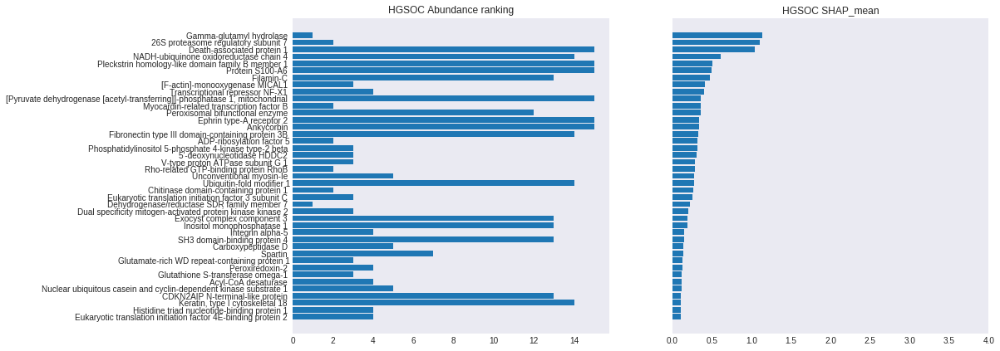

...

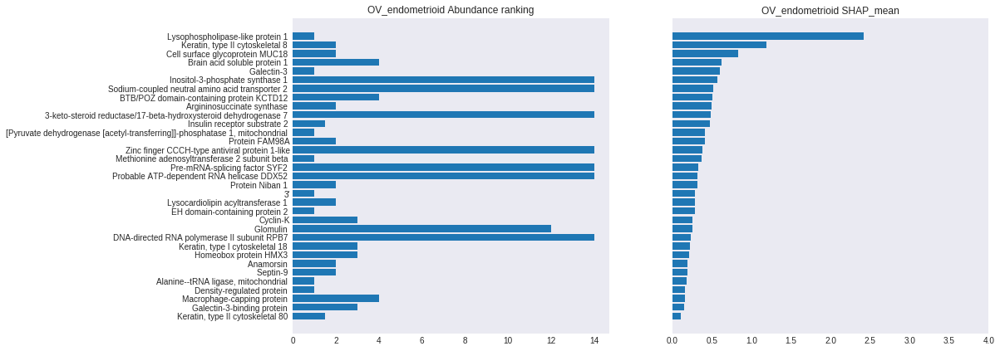

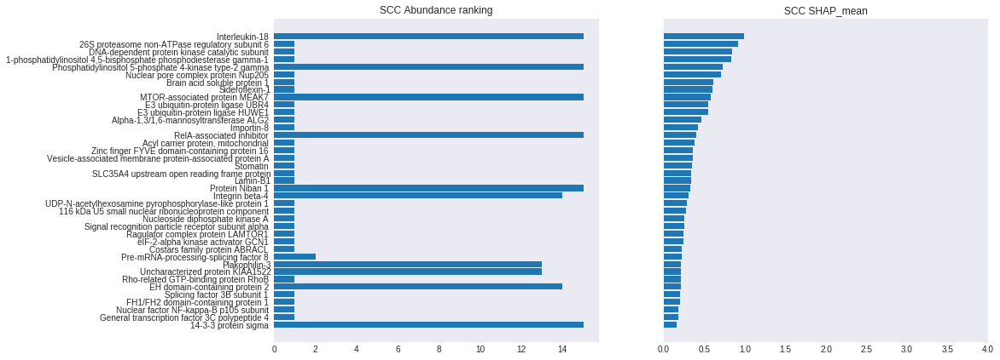

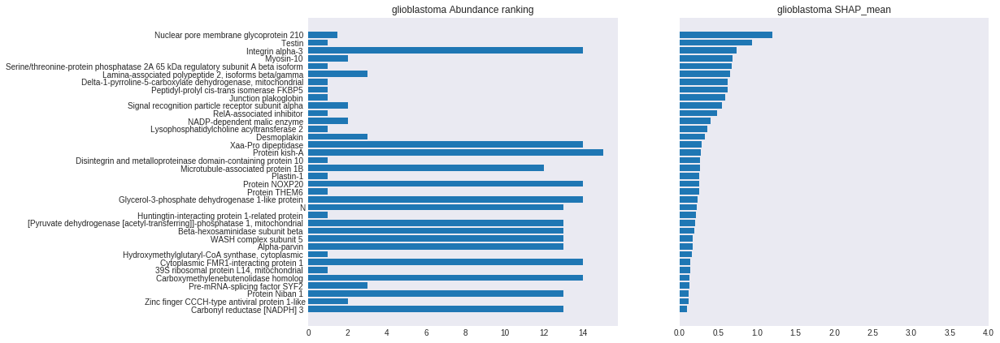

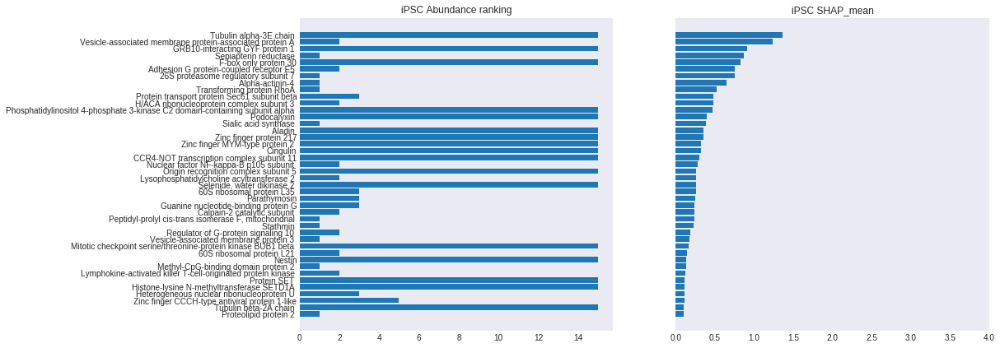

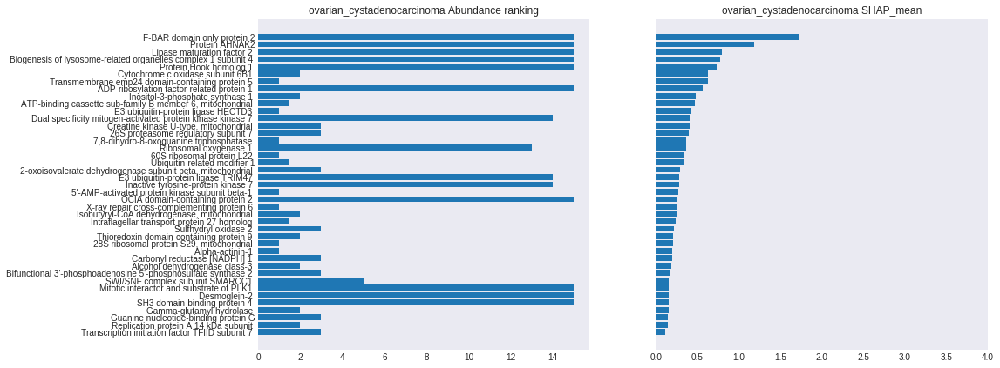

In [14]:
summaries_lr_thresh = []

for i in range(15):
    # L1 regularization has put all coefficients to 0 that do not contribute to classificaiton
    summaries_lr_thresh.append(get_summary_df(i, shap_lr_train, hard_threshold=0.1))

for i in range(15):

    fig, ax = plt.subplots(1,2, figsize=(15,7), sharey=True)

    ax[0].barh(data = summaries_lr_thresh[i].sort_values("SHAP_mean"), y = "description", width="Abundance_rank")
    ax[1].barh(data = summaries_lr_thresh[i].sort_values("SHAP_mean"), y = "description", width="SHAP_mean")

    ax[1].set_ylabel(None)
    ax[1].set_xlim((0,4))

    ax[0].set_title(target_encoder.inverse_transform([i])[0] + " Abundance ranking")
    ax[1].set_title(target_encoder.inverse_transform([i])[0] + " SHAP_mean")

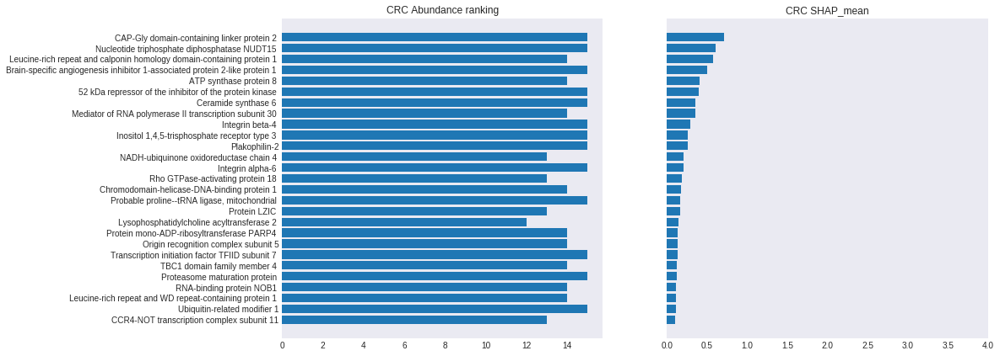

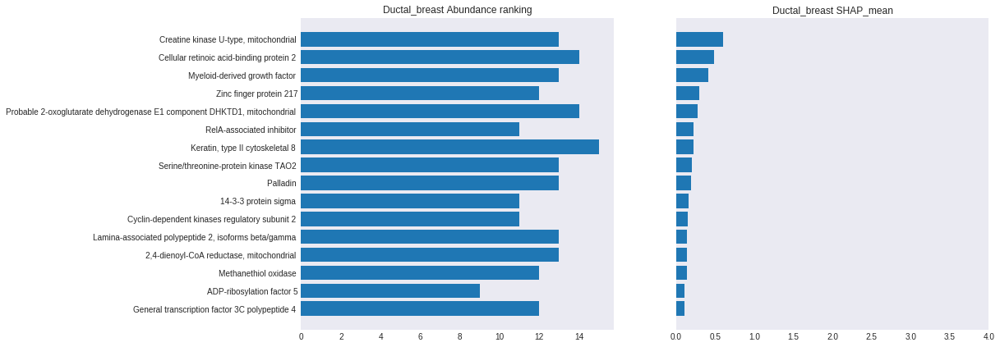

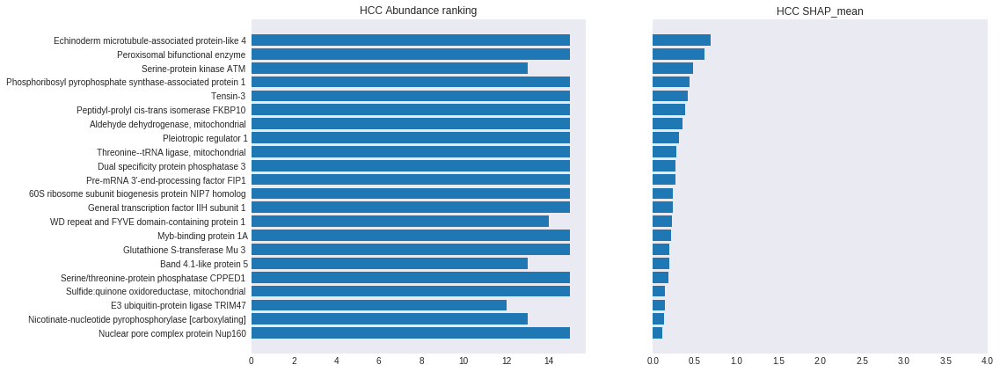

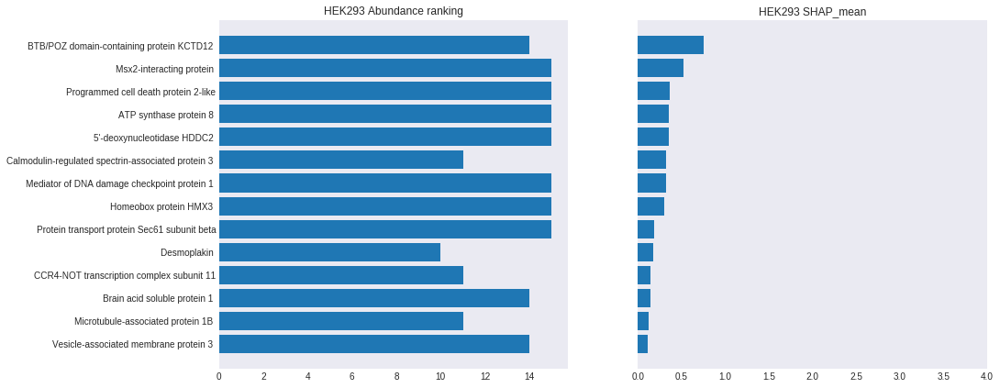

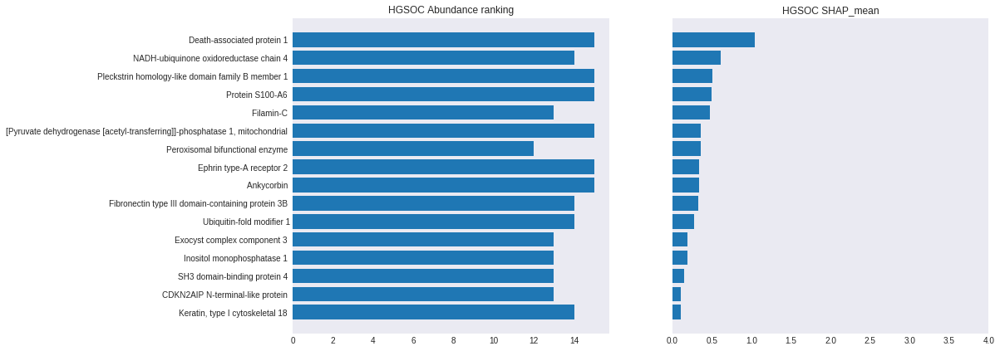

...

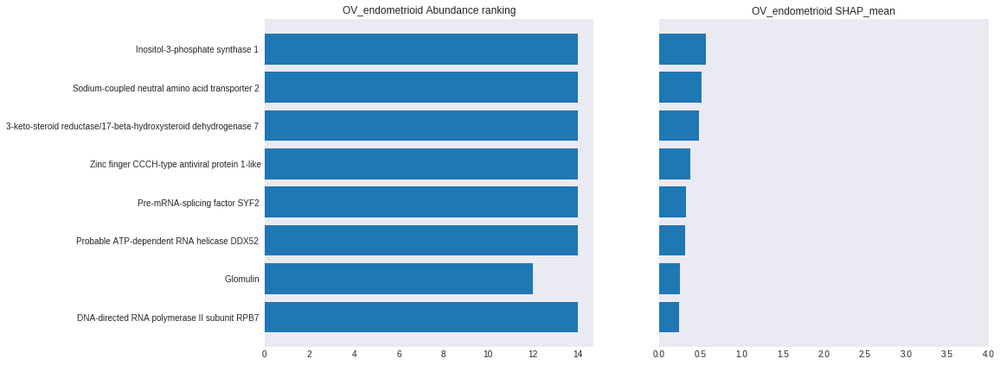

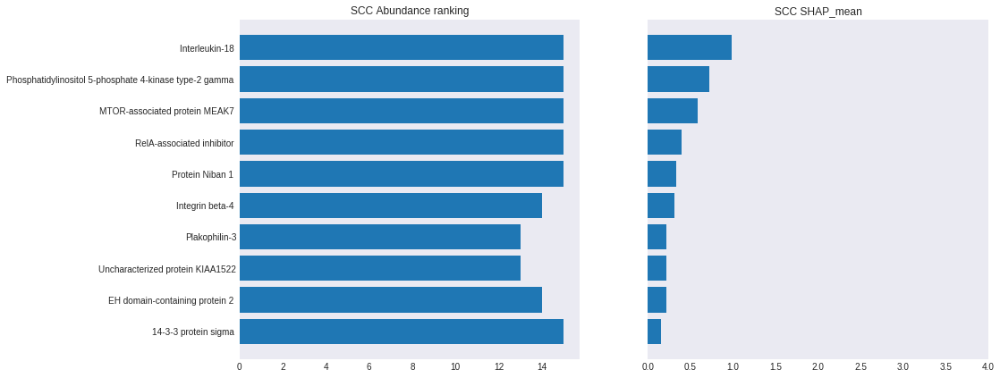

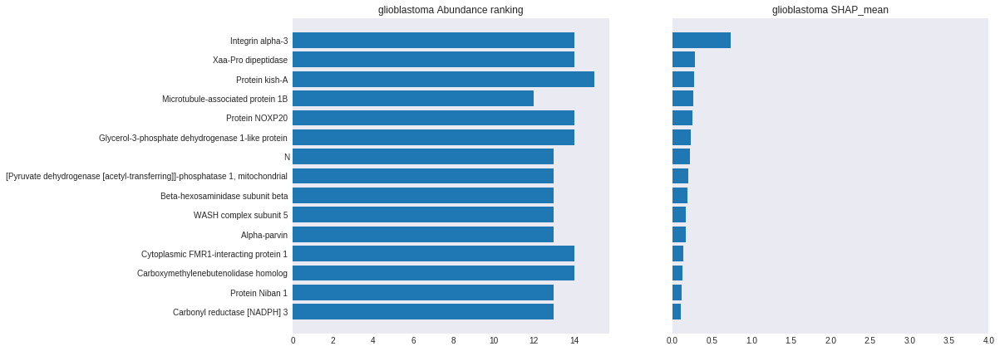

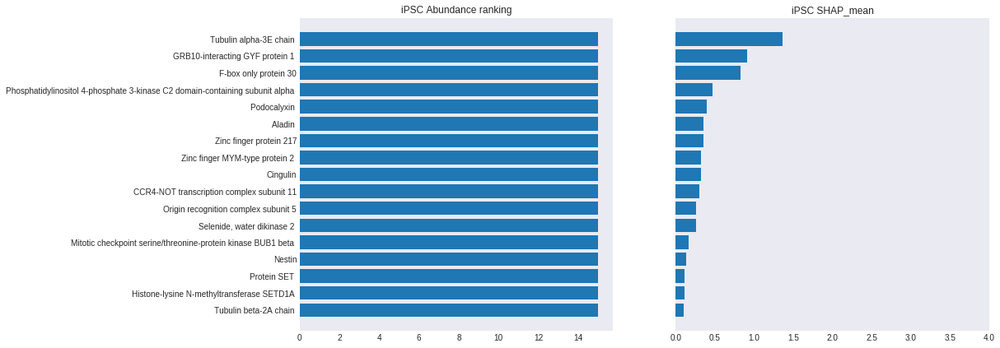

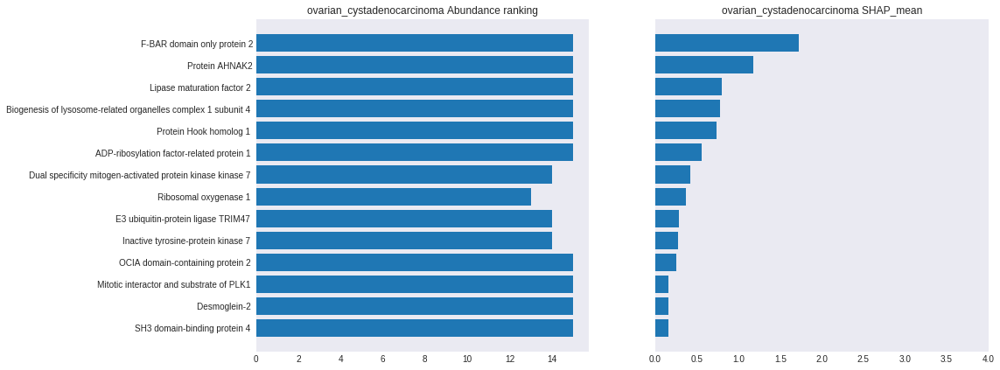

In [13]:
summaries_lr_thresh = []

for i in range(15):
    # L1 regularization has put all coefficients to 0 that do not contribute to classificaiton
    summaries_lr_thresh.append(get_summary_df(i, shap_lr_train, keep_only_enriched=True, hard_threshold=0.1))

for i in range(15):

    fig, ax = plt.subplots(1,2, figsize=(15,7), sharey=True)

    ax[0].barh(data = summaries_lr_thresh[i].sort_values("SHAP_mean"), y = "description", width="Abundance_rank")
    ax[1].barh(data = summaries_lr_thresh[i].sort_values("SHAP_mean"), y = "description", width="SHAP_mean")

    ax[1].set_ylabel(None)
    ax[1].set_xlim((0,4))

    ax[0].set_title(target_encoder.inverse_transform([i])[0] + " Abundance ranking")
    ax[1].set_title(target_encoder.inverse_transform([i])[0] + " SHAP_mean")

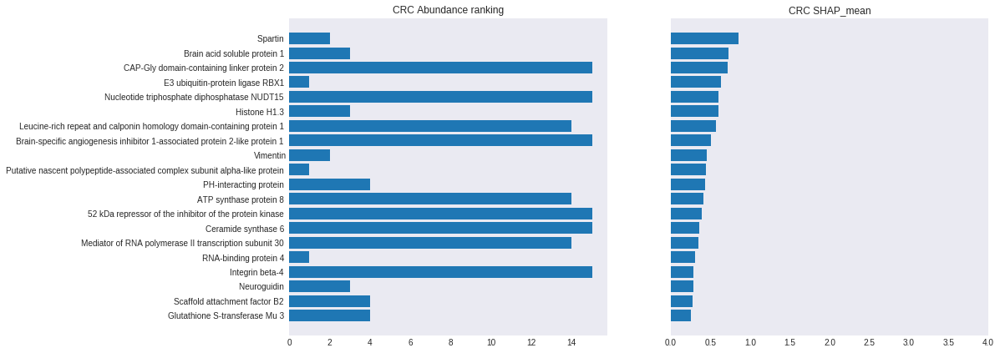

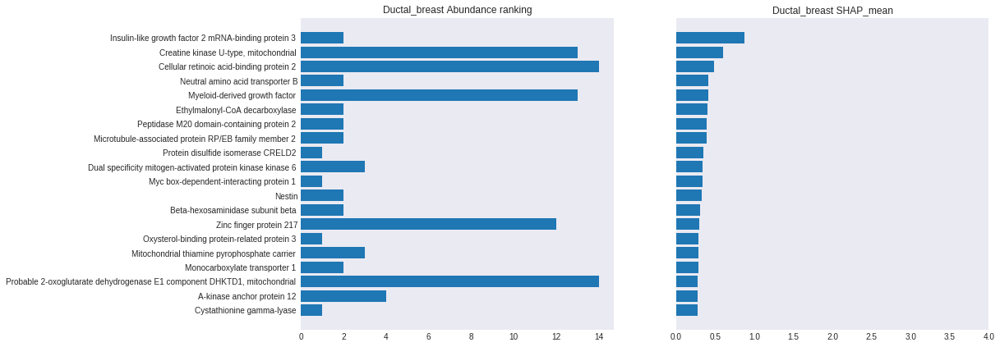

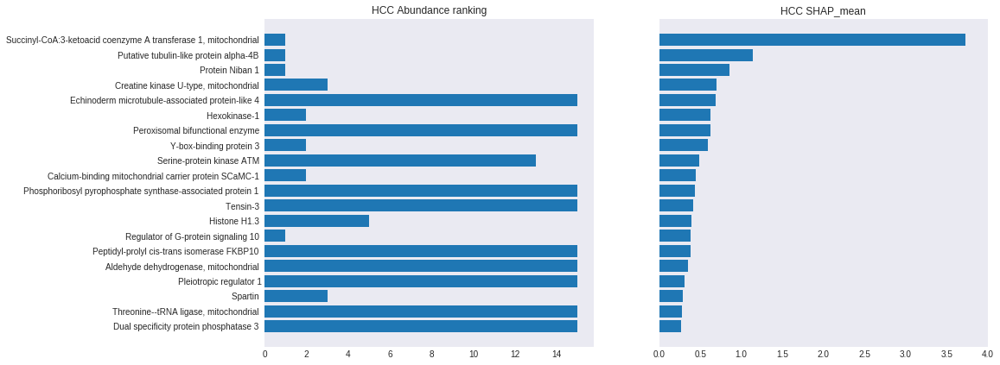

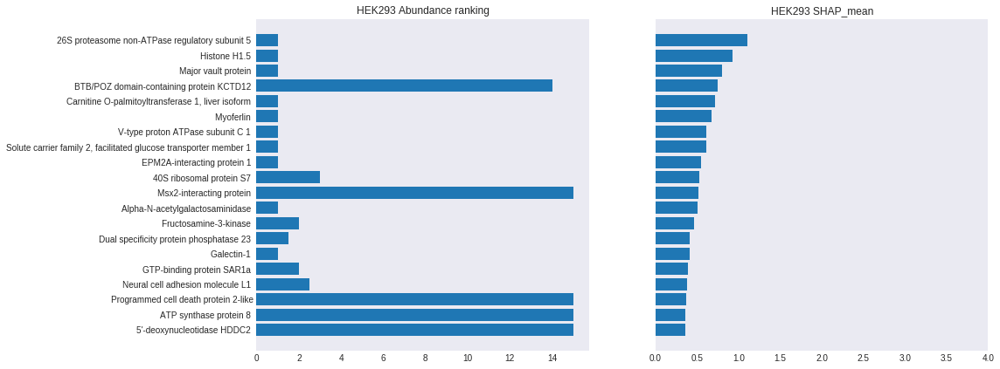

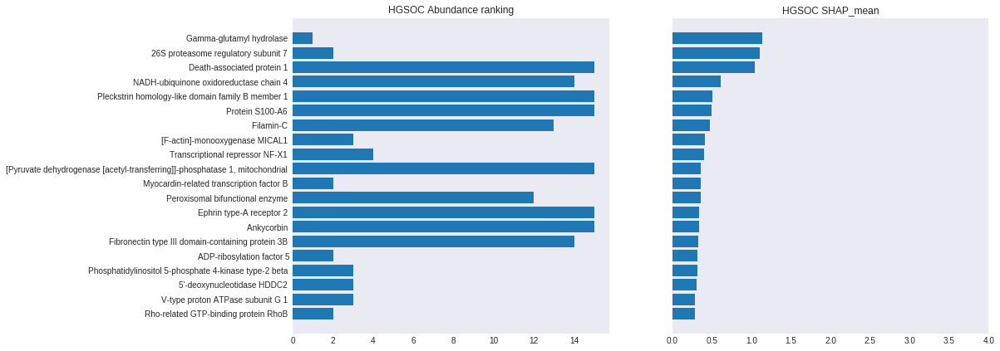

...

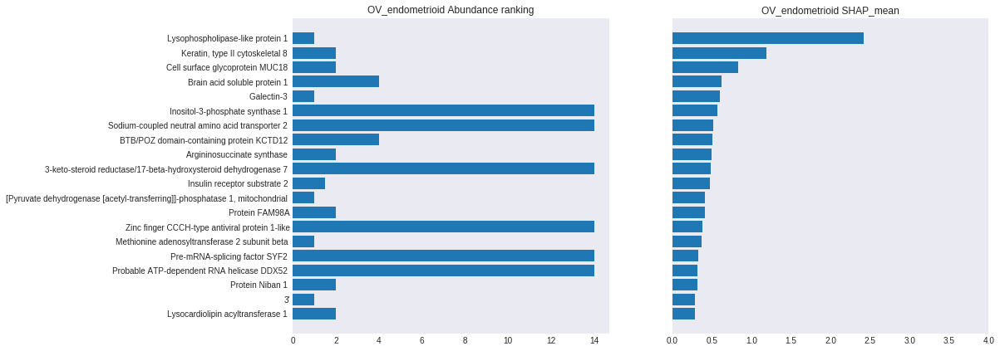

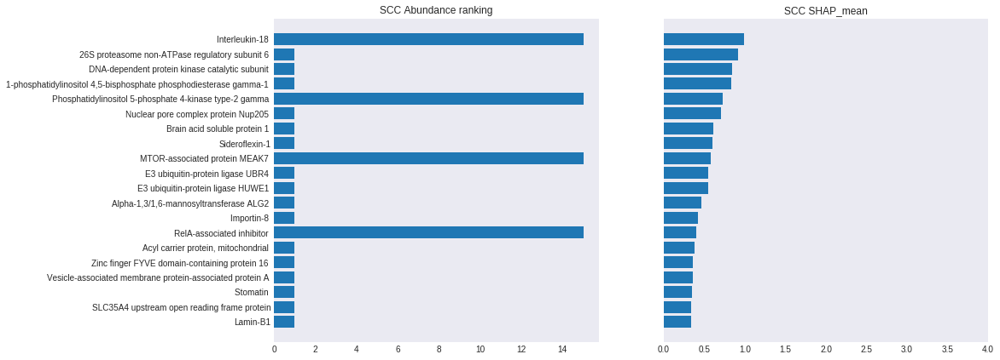

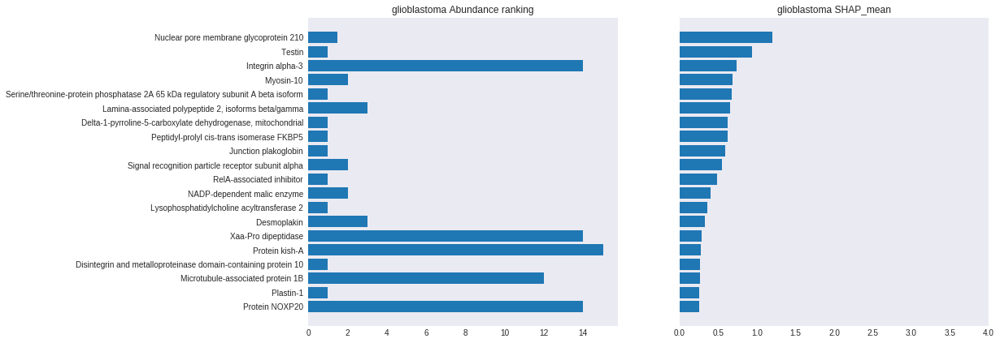

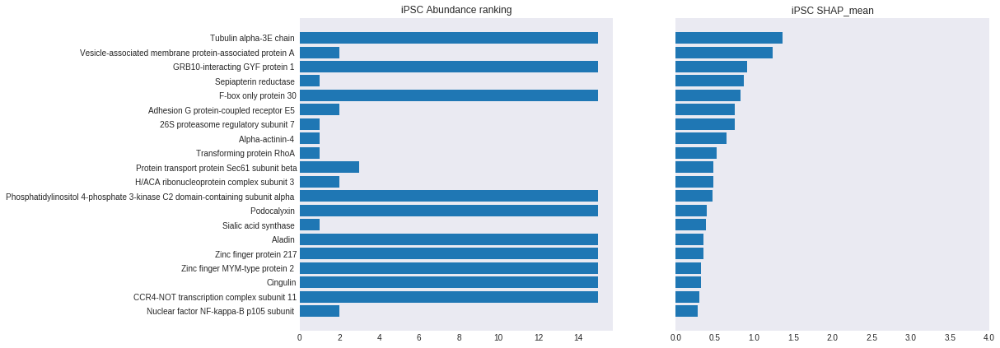

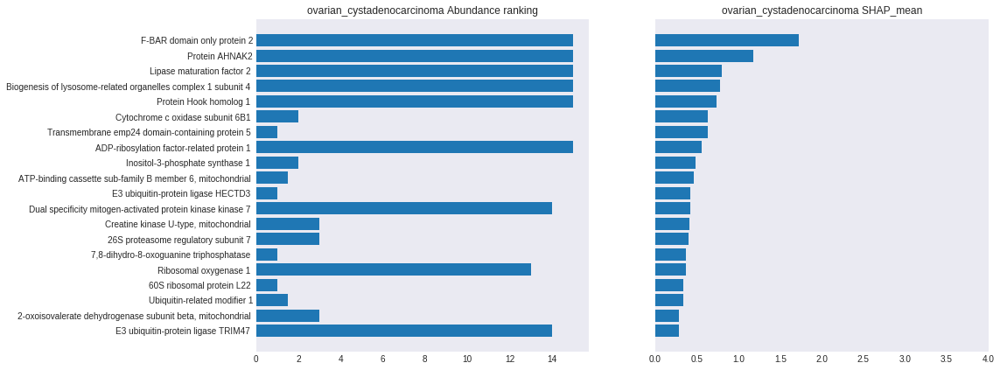

In [14]:
summaries_lr = []

for i in range(15):
    summaries_lr.append(get_summary_df(i, shap_lr_train))

for i in range(15):

    fig, ax = plt.subplots(1,2, figsize=(15,7), sharey=True)

    ax[0].barh(data = summaries_lr[i].iloc[0:20,:].sort_values("SHAP_mean"), y = "description", width="Abundance_rank")
    ax[1].barh(data = summaries_lr[i].iloc[0:20,:].sort_values("SHAP_mean"), y = "description", width="SHAP_mean")

    ax[1].set_ylabel(None)
    ax[1].set_xlim((0,4))

    ax[0].set_title(target_encoder.inverse_transform([i])[0] + " Abundance ranking")
    ax[1].set_title(target_encoder.inverse_transform([i])[0] + " SHAP_mean")

In [60]:
target_encoder.inverse_transform(list(range(15)))

array(['CRC', 'Ductal_breast', 'HCC', 'HEK293', 'HGSOC', 'HUVEC', 'HeLa',
       'Lymphoid_leukemia', 'Myeloid_leukemia', 'Neuroblastoma',
       'OV_endometrioid', 'SCC', 'glioblastoma', 'iPSC',
       'ovarian_cystadenocarcinoma'], dtype=object)

In [92]:
SCC = []
Ductal = []
for prot in get_summary_df(1, shap_svc_train, thresholding=True).index:
    Ductal.append(prot)
for prot in get_summary_df(11, shap_svc_train, thresholding=True).index:
    SCC.append(prot)

In [41]:
get_summary_df(4, shap_svc_train, thresholding = True).to_csv("HGSOC_SVC_features")

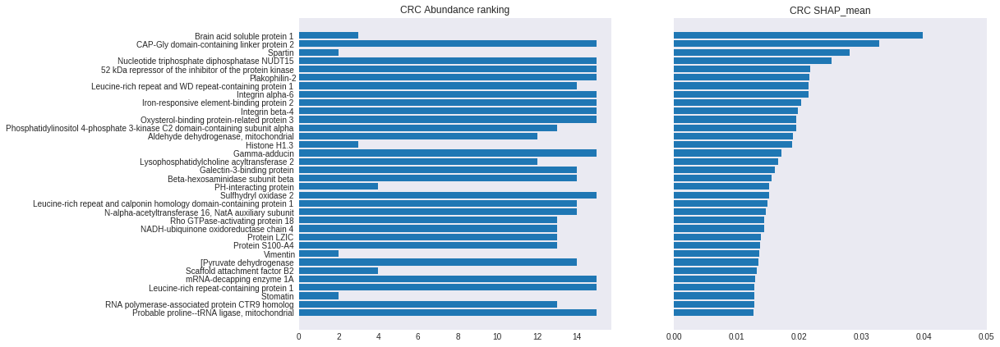

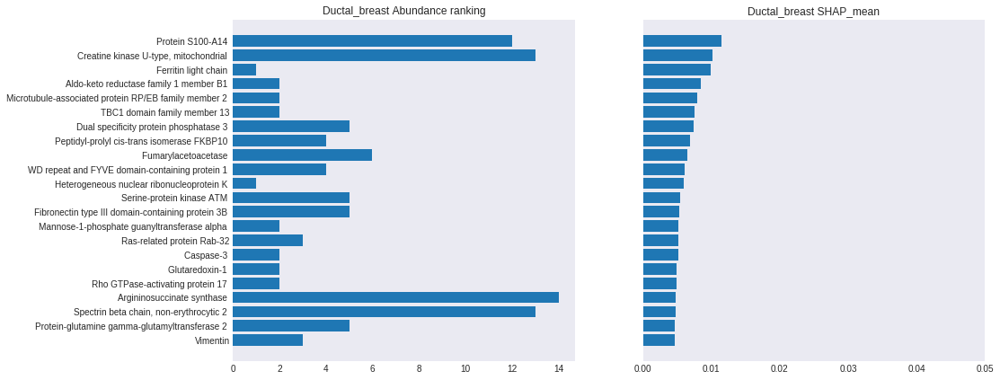

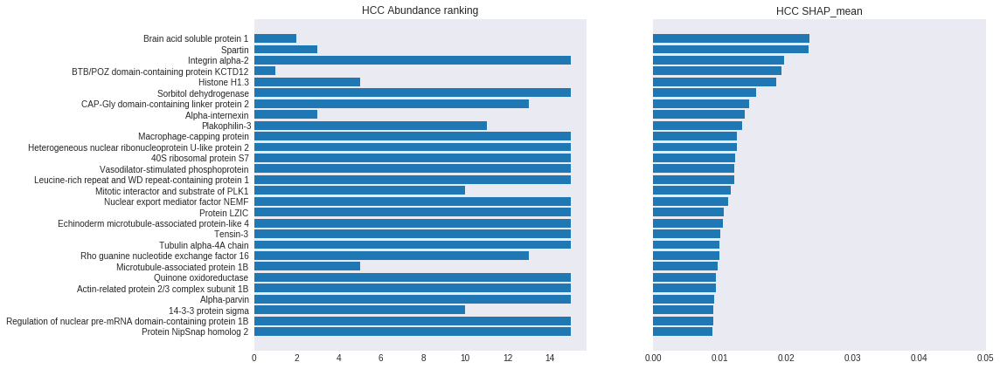

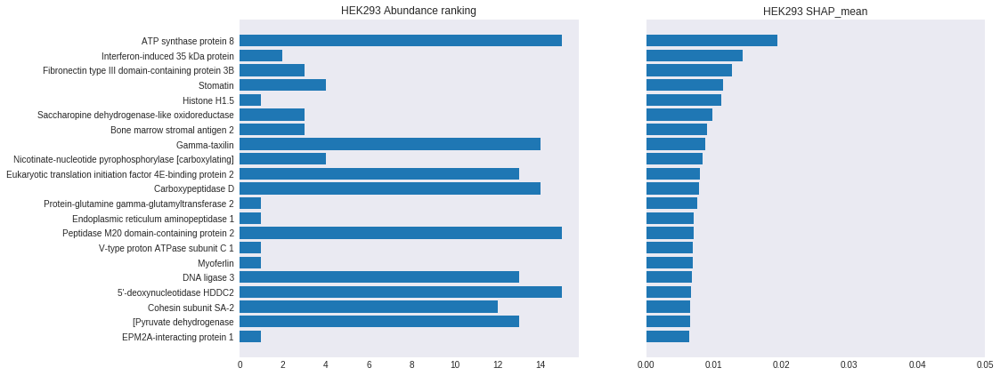

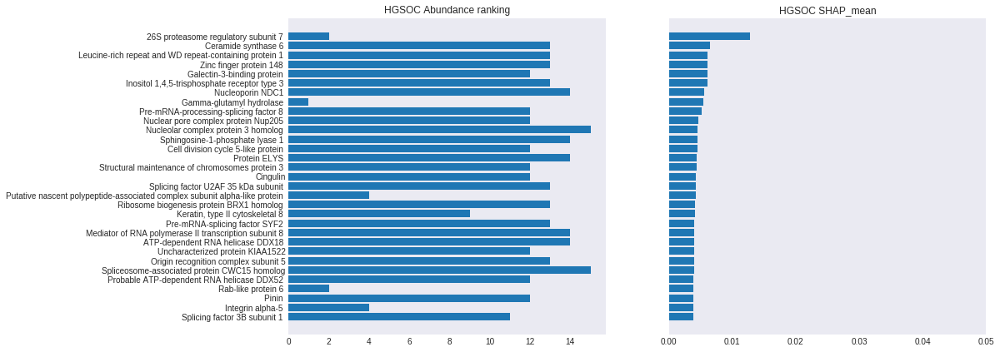

...

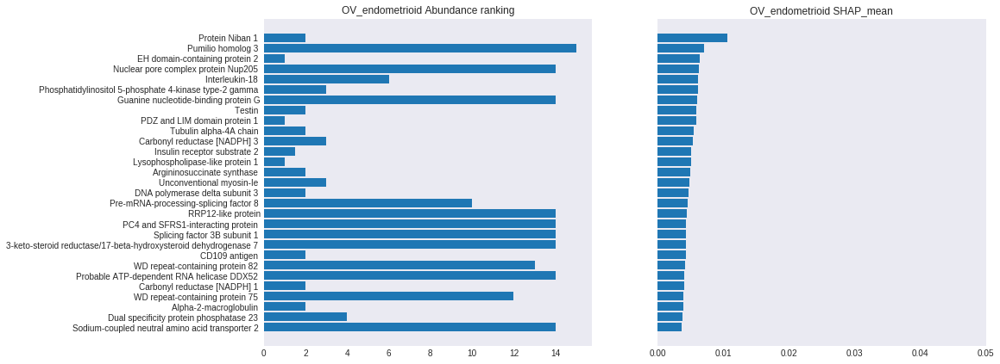

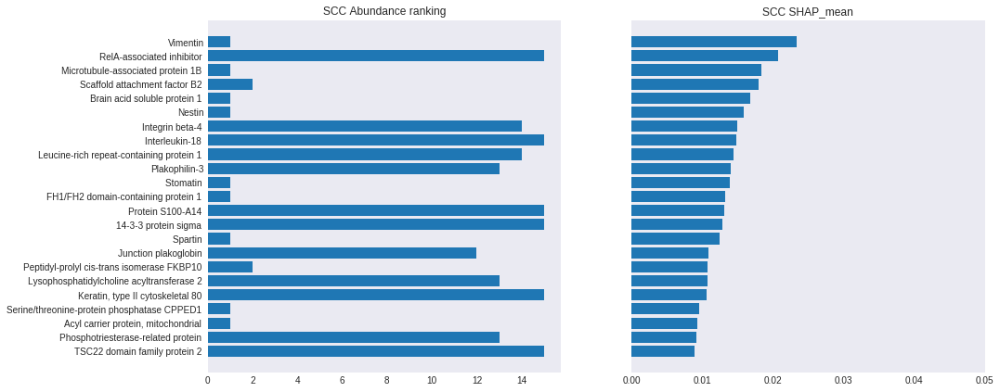

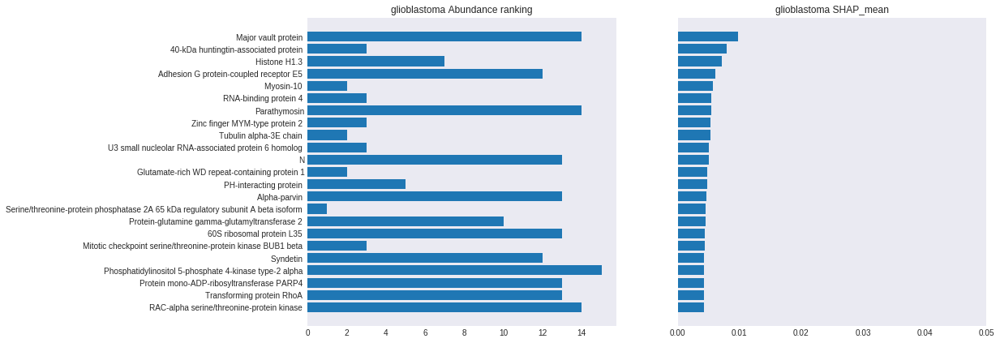

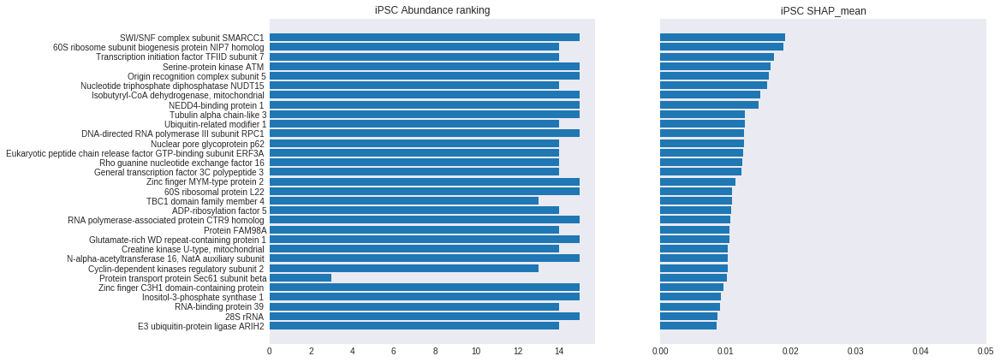

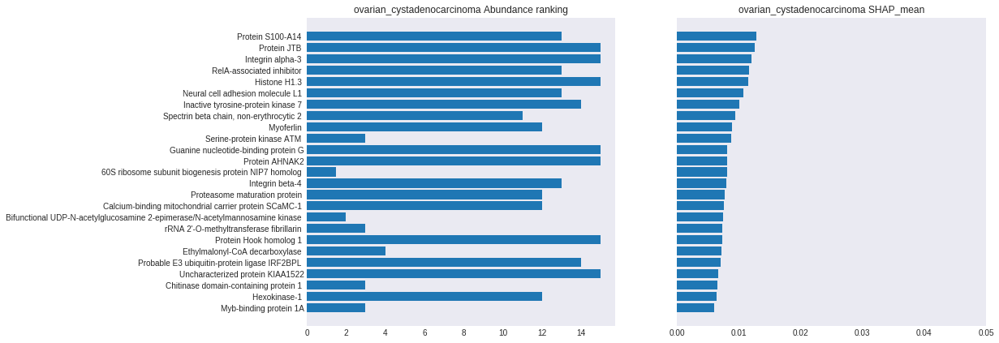

In [84]:
summaries_svc = []

for i in range(15):
    summaries_svc.append(get_summary_df(i, shap_svc_train, thresholding = True))

for i in range(15):

    fig, ax = plt.subplots(1,2, figsize=(15,7), sharey=True)

    ax[0].barh(data = summaries_svc[i].sort_values("SHAP_mean"), y = "description", width="Abundance_rank")
    ax[1].barh(data = summaries_svc[i].sort_values("SHAP_mean"), y = "description", width="SHAP_mean")

    ax[1].set_ylabel(None)
    ax[1].set_xlim((0,.05))

    ax[0].set_title(target_encoder.inverse_transform([i])[0] + " Abundance ranking")
    ax[1].set_title(target_encoder.inverse_transform([i])[0] + " SHAP_mean")

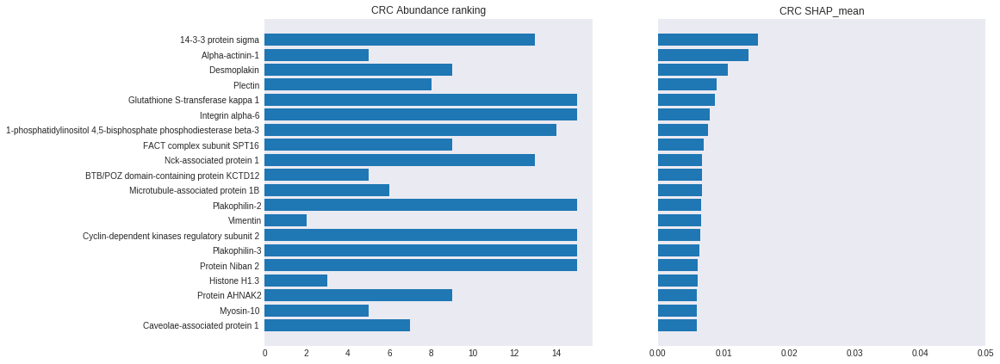

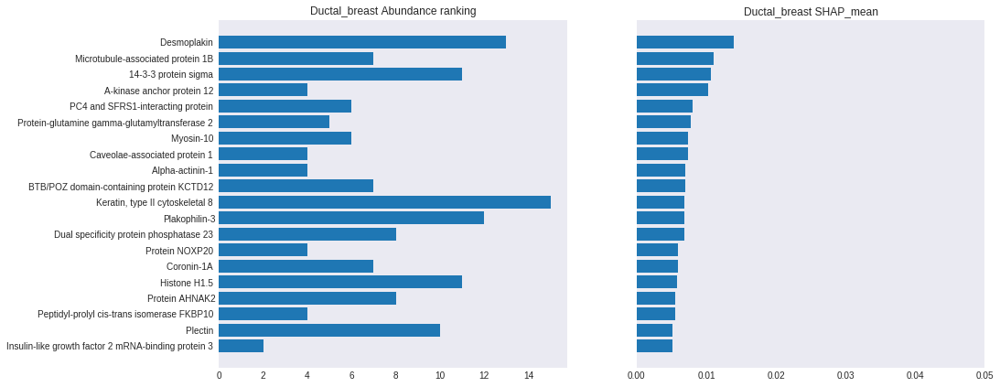

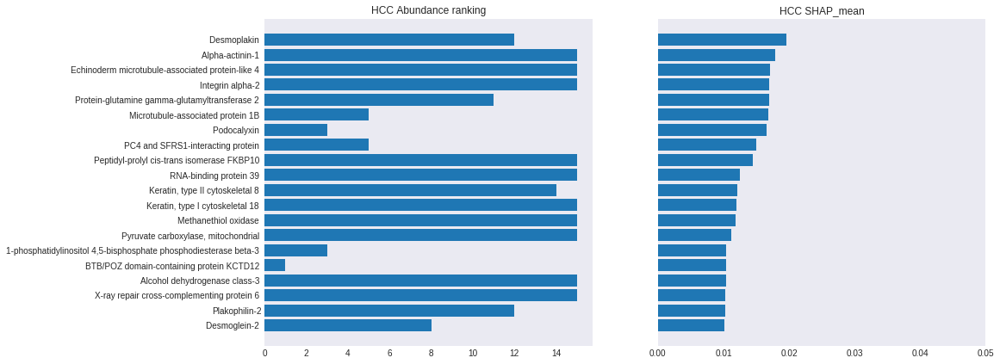

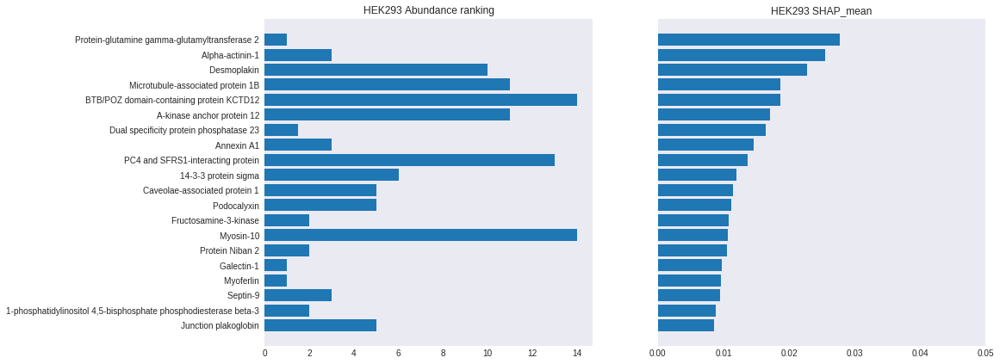

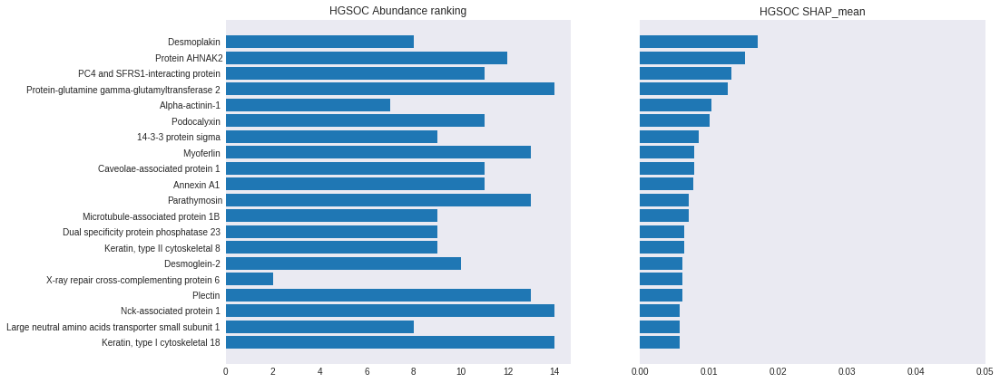

...

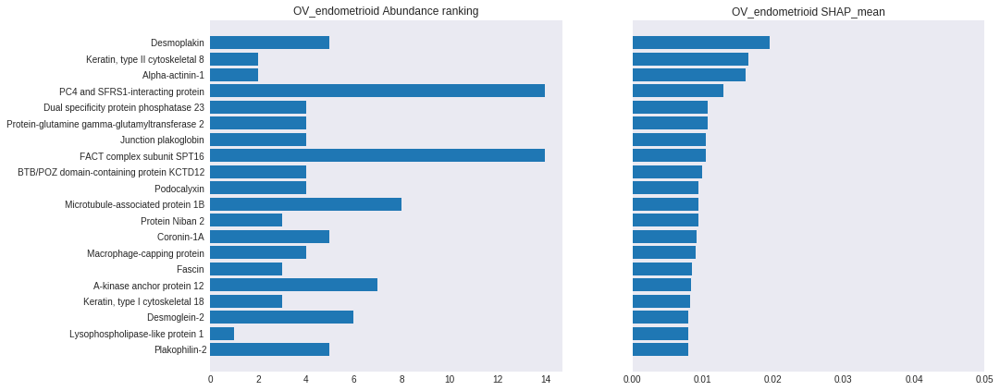

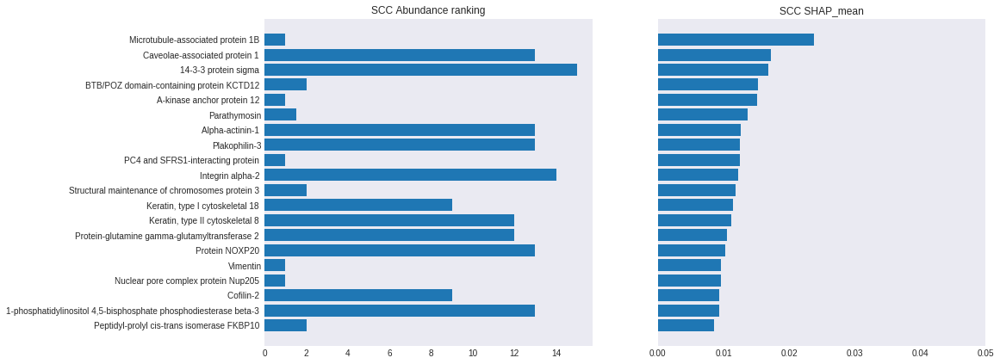

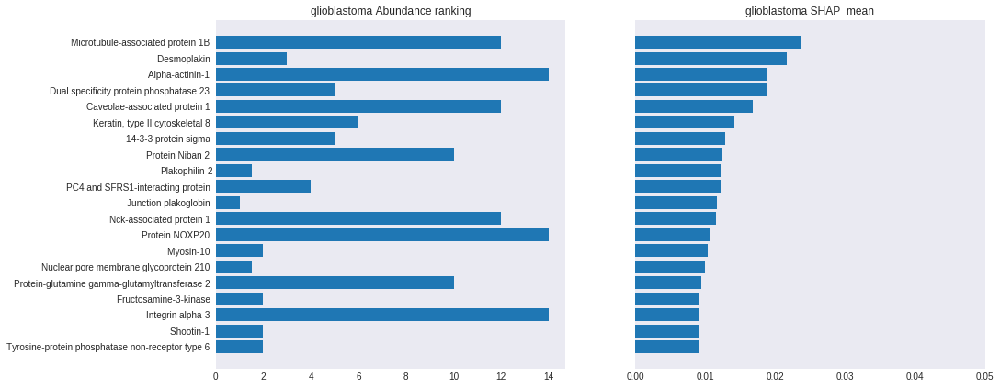

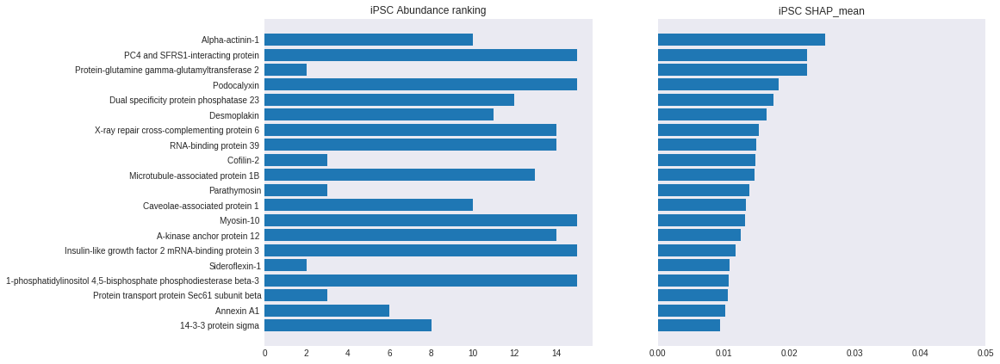

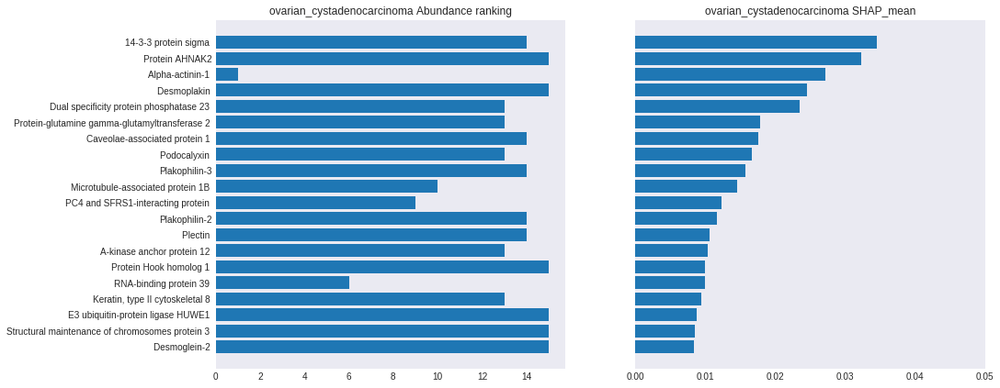

In [141]:
summaries_rf = []

for i in range(15):
    summaries_rf.append(get_summary_df(i, shap_rf_train))

for i in range(15):

    fig, ax = plt.subplots(1,2, figsize=(15,7), sharey=True)

    ax[0].barh(data = summaries_rf[i].iloc[0:20,:].sort_values("SHAP_mean"), y = "description", width="Abundance_rank")
    ax[1].barh(data = summaries_rf[i].iloc[0:20,:].sort_values("SHAP_mean"), y = "description", width="SHAP_mean")

    ax[1].set_ylabel(None)
    ax[1].set_xlim((0,.05))

    ax[0].set_title(target_encoder.inverse_transform([i])[0] + " Abundance ranking")
    ax[1].set_title(target_encoder.inverse_transform([i])[0] + " SHAP_mean")

# Interpreting feature importances with Reactome and String

In [19]:
pd.concat([get_summary_df(i, shap_lr_train, hard_threshold=0.1),get_summary_df(i, shap_svc_train, thresholding = True)])

,SHAP_mean,Abundance_rank,Abundance_mean,Abundance_std,description
Q0JRZ9,1.718303,15.0,0.763886,0.142514,F-BAR domain only protein 2
Q8IVF2,1.178940,15.0,0.907691,0.084819,Protein AHNAK2
Q9BU23,0.797664,15.0,0.655242,0.228525,Lipase maturation factor 2
Q9NUP1,0.775679,15.0,0.690152,0.343008,Biogenesis of lysosome-related organelles comp...
Q9UJC3,0.732176,15.0,0.863237,0.064418,Protein Hook homolog 1
...,...,...,...,...,...
Q9H1B7,0.007090,14.0,0.748123,0.326704,Probable E3 ubiquitin-protein ligase IRF2BPL
Q9P206,0.006685,15.0,0.633949,0.281188,Uncharacterized protein KIAA1522
Q9BWS9,0.006507,3.0,0.088258,0.176172,Chitinase domain-containing protein 1
P19367,0.006420,12.0,0.836503,0.030007,Hexokinase-1


In [14]:
combined_shaps = []
prots_per_class = {}

for i in range(15):
    lr_sum = get_summary_df(i, shap_lr_train, hard_threshold=0.1)
    lr_sum["model"] = "LR"
    svc_sum = get_summary_df(i, shap_svc_train, thresholding = True)
    svc_sum["model"] = "SVC"
    rf_sum = get_summary_df(i, shap_rf_train, thresholding = True)
    rf_sum["model"] = "RF"

    combined_shaps.append(pd.concat([lr_sum, svc_sum, rf_sum]))

    prots_per_class[target_encoder.inverse_transform([i])[0]] = combined_shaps[i].index.unique().tolist()

In [16]:
all_important_features = []
for  x in prots_per_class.values():
    all_important_features += x
all_important_features = set(all_important_features)

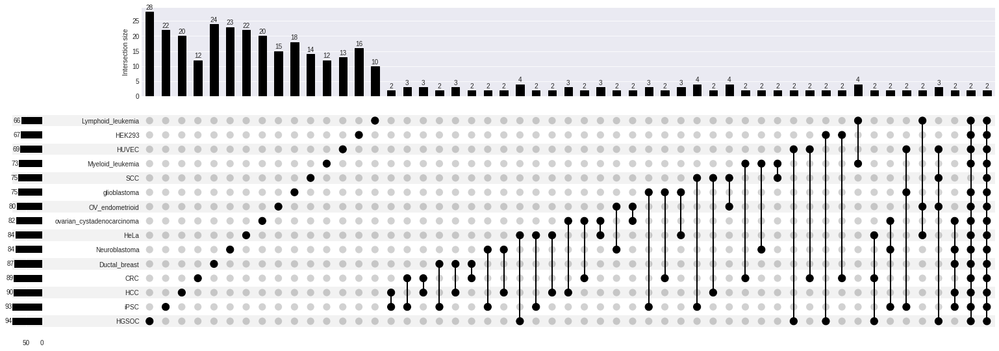

In [27]:
upset_cp = uplt.from_contents(prots_per_class)
uplt.UpSet(upset_cp, min_subset_size=2, show_counts=True)

In [313]:
def get_unique(dict_class_prots):
    class_specific = {}
    
    class_specific_prots = []
    all_prots = []
    for c, prots in dict_class_prots.items():
        all_prots += prots
    for prot in set(all_prots):
        if all_prots.count(prot) < 3:
            class_specific_prots.append(prot)
    
    for c, prots in dict_class_prots.items():
        class_specific[c] = [prot for prot in prots if prot in class_specific_prots]
    return class_specific

In [314]:
ccl_specific_prots = get_unique(prots_per_class)

<BarContainer object of 15 artists>

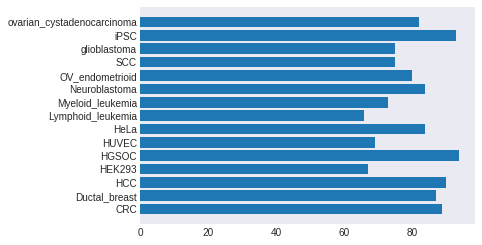

In [31]:
plt.barh(y=list(prots_per_class.keys()), width=[len(x) for x in prots_per_class.values()])

<BarContainer object of 15 artists>

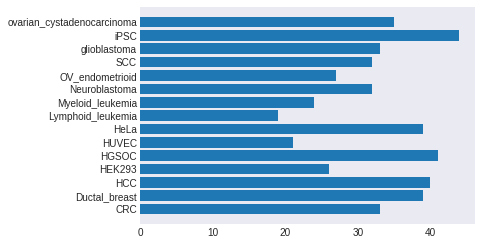

In [316]:
plt.barh(y=list(ccl_specific_prots.keys()), width=[len(x) for x in ccl_specific_prots.values()])

In [318]:
for c, prots in ccl_specific_prots.items():
    print(c)
    for prot in prots:
        print(prot)
    print("___________________")

CRC
P62877
Q9NV35
Q9Y2L9
Q9UHR4
P03928
O43422
Q6ZMG9
Q96HR3
Q9BWF3
Q8NEJ9
P21266
P52594
P15121
Q8N392
O75367
O14646
Q7L3T8
Q8WZA0
Q9UKK3
P16403
Q9Y244
Q9ULX3
Q02880
P48200
O00443
Q9UEY8
Q6N069
Q15120
Q9NPI6
Q9BTT6
Q9Y2Q3
Q9BW60
P22087
___________________
Ductal_breast
O00425
P29373
Q15758
Q969H8
Q9NTX5
Q8IYS1
Q15555
Q6UXH1
O00499
O75362
Q9HC21
P53985
Q96HY7
P32929
P26038
Q9UNW1
P55809
Q8NFH3
Q9UL54
Q8WX93
Q9P013
Q9Y2S7
P42167
Q9NPI6
Q16698
A8MXV4
O95169
Q9UKN8
P02792
P15121
Q9NVG8
P51452
P16930
Q8IWB7
P61978
Q96IJ6
P42574
P35754
Q68EM7
___________________
HCC
P55809
Q9H853
Q9HC35
P16989
Q6NUK1
Q68CZ2
O43665
O43660
Q9BW92
P51452
Q6UN15
L0R6Q1
P32780
Q8IWB7
Q9BQG0
P21266
Q9HCM4
Q9BW60
Q9BRF8
P56545
Q9Y6N5
Q96LD4
Q12769
Q00796
Q1KMD3
P62081
O60524
Q8WZA0
Q5VV41
Q08257
O15143
Q9NVD7
Q9NQG5
O75323
P11498
P06737
O60488
P10644
P30085
Q9UBM7
___________________
HEK293
Q16401
Q14764
P50416
P21283
P11166
P62081
Q96T58
P17050
P09382
Q9NR31
Q9BRP1
P03928
Q7Z4H3
Q9P1Y5
Q14676
Q96RS6
P16435
Q15836
Q

In [240]:
def calc_go(list_of_prots, go_type, missing_ontology):
    gos = []
    for prot in list_of_prots:
        if prot not in missing_ontology:
            gos += go_type[prot]
    go_df = {}

    renaming = {}
    for go in set(gos):
        go_df[go] = gos.count(go)

        if go in GO_description.index:
            renaming[go] = GO_description.loc[go].annotation_label

    return pd.Series(go_df).rename(index = renaming)

Text(0.5, 1.0, 'Features deemed unimportant GO')

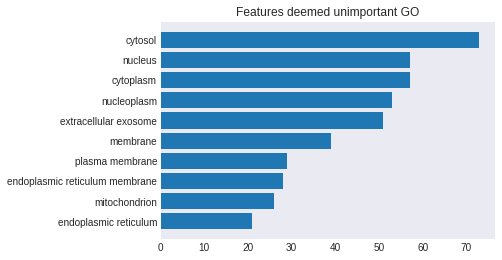

In [182]:
all_prots_important = []
for x in prots_per_class.values():
    all_prots_important += x
all_prots_important = list(set(all_prots_important))

not_important_prots = []
for x in features:
    if x not in all_prots_important:
        not_important_prots.append(x)
len(not_important_prots)

unimportant_go_df = calc_go(not_important_prots)

plt.barh(y=GO_description.loc[unimportant_go_df.sort_values(ascending=False)[:10].sort_values().index].annotation_label, width = unimportant_go_df.sort_values(ascending=False)[:10].sort_values())
plt.title("Features deemed unimportant GO")

In [204]:
len(combined_shaps[14].loc[prots].index[combined_shaps[14].loc[prots].Abundance_rank > 8])

53

Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



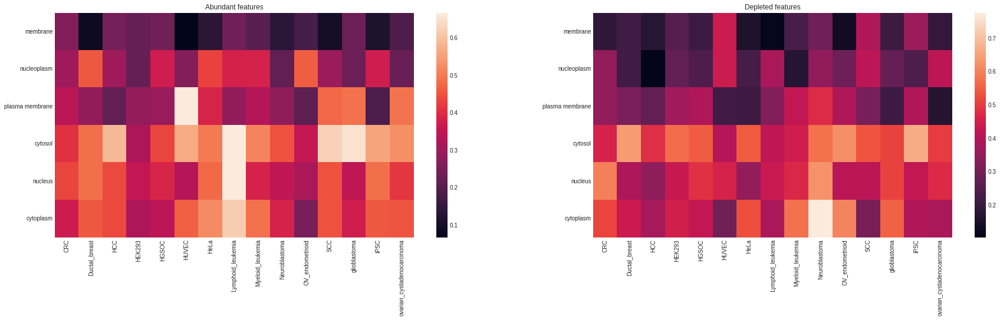

In [213]:
go_per_class_abundant = []
go_per_class_depleted = []

fig, ax = plt.subplots(1,2, figsize=(30,7))

for i, prots in prots_per_class.items():

    ind = target_encoder.transform([i])[0]
    abundant_important_features = combined_shaps[ind].loc[prots].index[combined_shaps[ind].loc[prots].Abundance_rank > 7]
    depleted_important_features = combined_shaps[ind].loc[prots].index[combined_shaps[ind].loc[prots].Abundance_rank <= 7]

    go_per_class_abundant.append(calc_go(abundant_important_features).rename(i)/len(abundant_important_features), uniprot_go_compartment, missing_ontology_C)
    go_per_class_depleted.append(calc_go(depleted_important_features).rename(i)/len(depleted_important_features), uniprot_go_compartment, missing_ontology_C)

ax[0].set_title("Abundant features")
ax[1].set_title("Depleted features")
sns.heatmap(pd.concat(go_per_class_abundant,axis=1).loc[["membrane", "nucleoplasm", "plasma membrane", "cytosol", "nucleus", "cytoplasm"]], ax = ax[0])
sns.heatmap(pd.concat(go_per_class_depleted,axis=1).loc[["membrane", "nucleoplasm", "plasma membrane", "cytosol", "nucleus", "cytoplasm"]], ax = ax[1])

76 37
35 64
73 29
31 51
67 33
30 50
44 57
21 62
39 47
60 40
28 68
40 58
43 47
70 33
53 36


Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



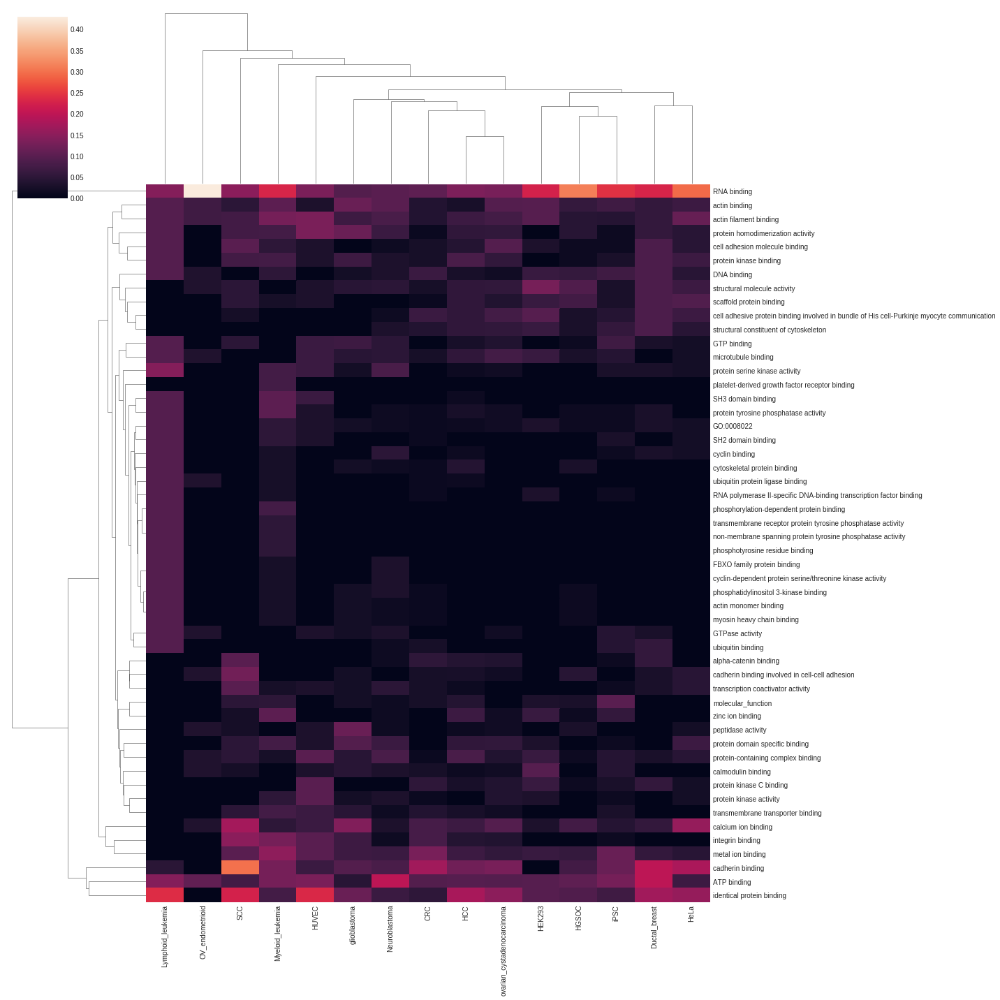

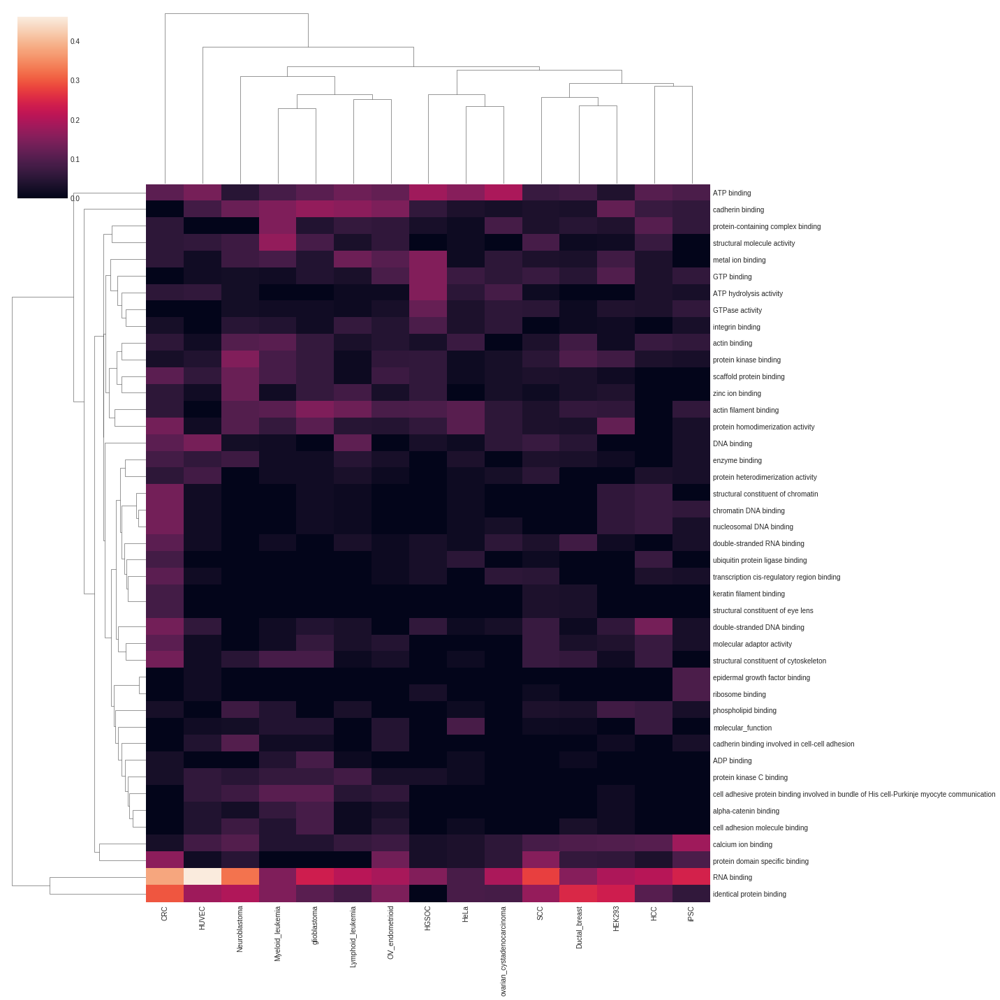

In [276]:
go_per_class_abundant = []
go_per_class_depleted = []

for i, prots in prots_per_class.items():

    ind = target_encoder.transform([i])[0]
    abundant_important_features = combined_shaps[ind].loc[prots].index[combined_shaps[ind].loc[prots].Abundance_rank > 7]
    depleted_important_features = combined_shaps[ind].loc[prots].index[combined_shaps[ind].loc[prots].Abundance_rank <= 7]

    go_per_class_abundant.append(calc_go(abundant_important_features, uniprot_go_function, missing_ontology_F).rename(i)/len(abundant_important_features))
    go_per_class_depleted.append(calc_go(depleted_important_features, uniprot_go_function, missing_ontology_F).rename(i)/len(depleted_important_features))

    print(len(abundant_important_features), len(depleted_important_features))

go_per_class_abundant = pd.concat(go_per_class_abundant,axis=1).fillna(0)
go_per_class_depleted = pd.concat(go_per_class_depleted,axis=1).fillna(0)

indices_abundant = go_per_class_abundant.index[(go_per_class_abundant<.3).any(axis=1) & (go_per_class_abundant>.075).any(axis=1)]
indices_depleted = go_per_class_depleted.index[(go_per_class_depleted<.3).any(axis=1) & (go_per_class_depleted>.075).any(axis=1)]

sns.clustermap(go_per_class_abundant.loc[indices_abundant], figsize=(20,20))
sns.clustermap(go_per_class_depleted.loc[indices_depleted], figsize=(20,20))

In [ ]:
go_per_class_abundant = []
go_per_class_depleted = []

fig, ax = plt.subplots(1,2, figsize=(30,7))

for i, prots in prots_per_class.items():

    ind = target_encoder.transform([i])[0]
    abundant_important_features = combined_shaps[ind].loc[prots].index[combined_shaps[ind].loc[prots].Abundance_rank > 7]
    depleted_important_features = combined_shaps[ind].loc[prots].index[combined_shaps[ind].loc[prots].Abundance_rank <= 7]

    go_per_class_abundant.append(calc_go(abundant_important_features).rename(i)/len(abundant_important_features), uniprot_go_process, missing_ontology_P)
    go_per_class_depleted.append(calc_go(depleted_important_features).rename(i)/len(depleted_important_features), uniprot_go_process, missing_ontology_P)

76 37
35 64
73 29
31 51
67 33
30 50
44 57
21 62
39 47
60 40
28 68
40 58
43 47
70 33
53 36


Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



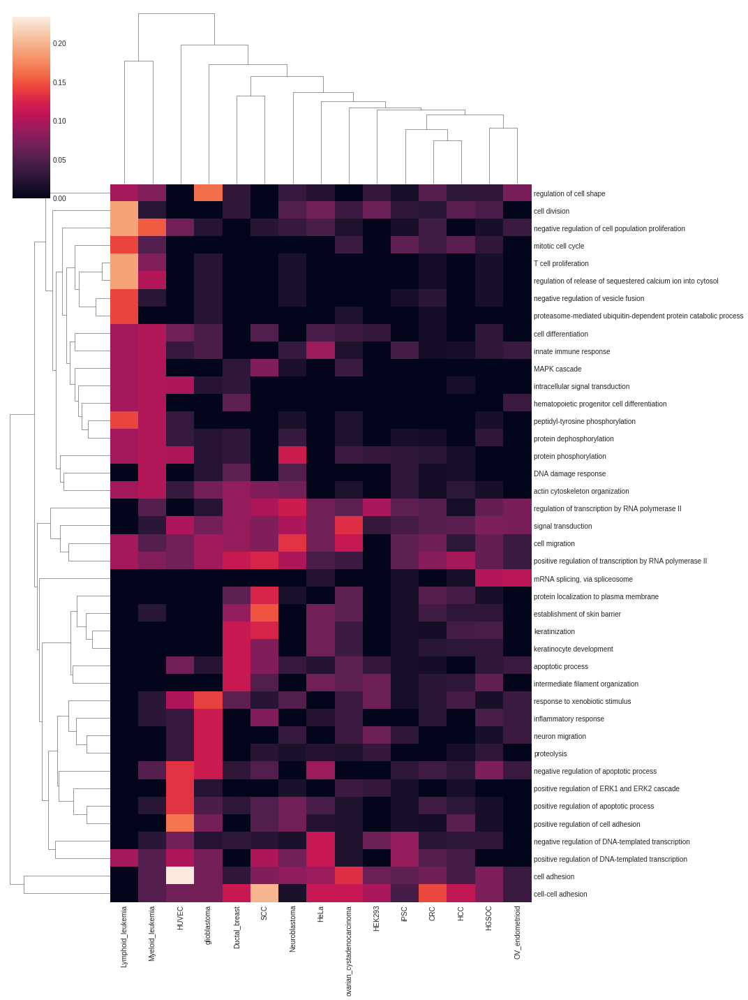

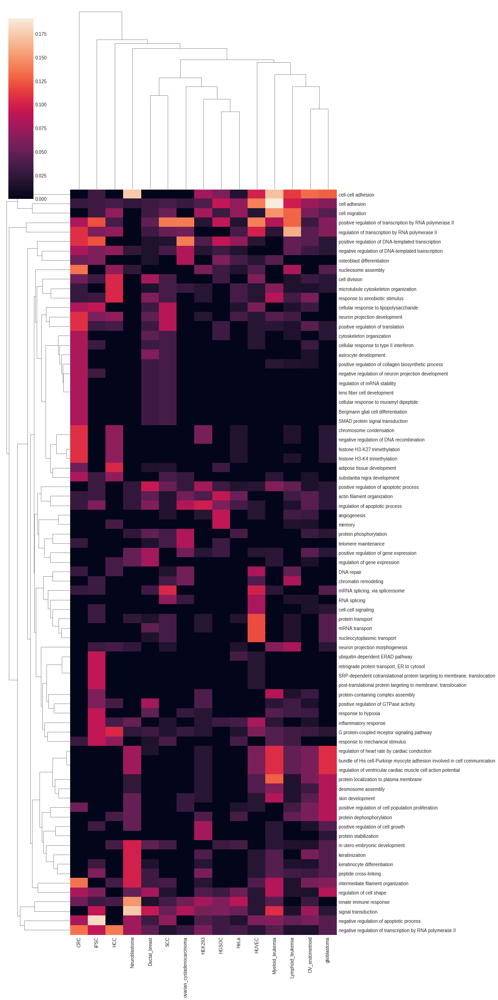

In [284]:
go_per_class_abundant = []
go_per_class_depleted = []

for i, prots in prots_per_class.items():

    ind = target_encoder.transform([i])[0]
    abundant_important_features = combined_shaps[ind].loc[prots].index[combined_shaps[ind].loc[prots].Abundance_rank > 7]
    depleted_important_features = combined_shaps[ind].loc[prots].index[combined_shaps[ind].loc[prots].Abundance_rank <= 7]

    go_per_class_abundant.append(calc_go(abundant_important_features, uniprot_go_process, missing_ontology_P).rename(i)/len(abundant_important_features))
    go_per_class_depleted.append(calc_go(depleted_important_features, uniprot_go_process, missing_ontology_P).rename(i)/len(depleted_important_features))

    print(len(abundant_important_features), len(depleted_important_features))

go_per_class_abundant = pd.concat(go_per_class_abundant,axis=1).fillna(0)
go_per_class_depleted = pd.concat(go_per_class_depleted,axis=1).fillna(0)

indices_abundant = go_per_class_abundant.index[(go_per_class_abundant>.1).any(axis=1)]
indices_depleted = go_per_class_depleted.index[(go_per_class_depleted>.075).any(axis=1)]

sns.clustermap(go_per_class_abundant.loc[indices_abundant], figsize=(15,20))
sns.clustermap(go_per_class_depleted.loc[indices_depleted], figsize=(15,30))

In [23]:
combined_shaps[0]

,SHAP_mean,Abundance_rank,Abundance_mean,Abundance_std,description,model
Q8N0X7,0.854150,2.0,0.045804,0.158497,Spartin,LR
P80723,0.725135,3.0,0.117937,0.230488,Brain acid soluble protein 1,LR
Q9UDT6,0.714771,15.0,0.725125,0.292178,CAP-Gly domain-containing linker protein 2,LR
P62877,0.630870,1.0,0.242698,0.170079,E3 ubiquitin-protein ligase RBX1,LR
Q9NV35,0.604454,15.0,0.682283,0.175809,Nucleotide triphosphate diphosphatase NUDT15,LR
...,...,...,...,...,...,...
Q9UQE7,0.004852,10.0,0.841783,0.065369,Structural maintenance of chromosomes protein 3,RF
P31146,0.004730,8.0,0.296563,0.208366,Coronin-1A,RF
P17301,0.004517,12.0,0.579201,0.225905,Integrin alpha-2,RF
P12956,0.004490,4.0,0.388347,0.137165,X-ray repair cross-complementing protein 6,RF


In [16]:
summaries_lr_thresh = []
for i in range(15):
    # L1 regularization has put all coefficients to 0 that do not contribute to classificaiton
    summaries_lr_thresh.append(get_summary_df(i, shap_lr_train, hard_threshold=0.1))

summaries_svc = []
for i in range(15):
    summaries_svc.append(get_summary_df(i, shap_svc_train, thresholding = True))

summaries_rf = []
for i in range(15):
    summaries_rf.append(get_summary_df(i, shap_rf_train, thresholding = True))

In [97]:
count=0
for x in summaries_svc[0].index:
    if x in summaries_lr_thresh[0].index:
        count+=1
print(count)

20


In [109]:
overlap_summaries = []
for x in range(15):
    overlap_summaries.append(pd.merge(summaries_svc[x], summaries_lr_thresh[x], left_index=True, right_index=True, suffixes=("_SVC", "_LR"))["SHAP_mean_SVC Abundance_rank_SVC Abundance_mean_SVC Abundance_std_SVC description_SVC SHAP_mean_LR".split()])

In [125]:
overlap_summaries[0]

,SHAP_mean_SVC,Abundance_rank_SVC,Abundance_mean_SVC,Abundance_std_SVC,description_SVC,SHAP_mean_LR
P80723,0.039832,3.0,0.117937,0.230488,Brain acid soluble protein 1,0.725135
Q9UDT6,0.032841,15.0,0.725125,0.292178,CAP-Gly domain-containing linker protein 2,0.714771
Q8N0X7,0.028128,2.0,0.045804,0.158497,Spartin,0.854150
Q9NV35,0.025235,15.0,0.682283,0.175809,Nucleotide triphosphate diphosphatase NUDT15,0.604454
O43422,0.021787,15.0,0.738291,0.242536,52 kDa repressor of the inhibitor of the prote...,0.389654
Q99959,0.021628,15.0,0.691437,0.250591,Plakophilin-2,0.252946
Q9UFC0,0.021487,14.0,0.618610,0.157651,Leucine-rich repeat and WD repeat-containing p...,0.113605
P23229,0.021479,15.0,0.739383,0.190673,Integrin alpha-6,0.204795
P16144,0.019831,15.0,0.750050,0.210361,Integrin beta-4,0.290959
P16402,0.018919,3.0,0.031006,0.129320,Histone H1.3,0.602532


In [107]:
CRC_lr_svc_overlap.to_csv("LR_SVC_shap_CRC.csv")

In [108]:
for x in CRC_lr_svc_overlap.index:
    print(x)

P80723
Q9UDT6
Q8N0X7
Q9NV35
O43422
Q99959
Q9UFC0
P23229
P16144
P16402
Q7L5N7
Q8WWQ0
Q9Y2L9
Q8N392
P03905
Q8WZA0
P08670
Q14151
P27105
Q7L3T8


In [99]:
summaries_svc[0].shape

(34, 5)

In [98]:
summaries_lr_thresh[0].shape

(47, 5)

# Potential Drug Targets

# Cancer related genes

In [7]:
columns_thpa = ['Uniprot',
                'Protein class',
                'Gene description',
                'Cell line expression cluster',
                'RNA cell line specificity',
                'RNA cell line distribution',
                'Pathology prognostics - Breast cancer',
                'Pathology prognostics - Cervical cancer',
                'Pathology prognostics - Colorectal cancer',
                'Pathology prognostics - Endometrial cancer',
                'Pathology prognostics - Glioma',
                'Pathology prognostics - Head and neck cancer',
                'Pathology prognostics - Liver cancer',
                'Pathology prognostics - Lung cancer',
                'Pathology prognostics - Melanoma',
                'Pathology prognostics - Ovarian cancer',
                'Pathology prognostics - Pancreatic cancer',
                'Pathology prognostics - Prostate cancer',
                'Pathology prognostics - Renal cancer',
                'Pathology prognostics - Stomach cancer',
                'Pathology prognostics - Testis cancer',
                'Pathology prognostics - Thyroid cancer',
                'Pathology prognostics - Urothelial cancer']

prognostics = ['Pathology prognostics - Breast cancer',
                'Pathology prognostics - Cervical cancer',
                'Pathology prognostics - Colorectal cancer',
                'Pathology prognostics - Endometrial cancer',
                'Pathology prognostics - Glioma',
                'Pathology prognostics - Head and neck cancer',
                'Pathology prognostics - Liver cancer',
                'Pathology prognostics - Lung cancer',
                'Pathology prognostics - Melanoma',
                'Pathology prognostics - Ovarian cancer',
                'Pathology prognostics - Pancreatic cancer',
                'Pathology prognostics - Prostate cancer',
                'Pathology prognostics - Renal cancer',
                'Pathology prognostics - Stomach cancer',
                'Pathology prognostics - Testis cancer',
                'Pathology prognostics - Thyroid cancer',
                'Pathology prognostics - Urothelial cancer']

In [8]:
cancer_related_genes = pd.read_csv("../annotation_files/THPA/cancer_related_genes.tsv", sep="\t", index_col="Uniprot", usecols=columns_thpa)

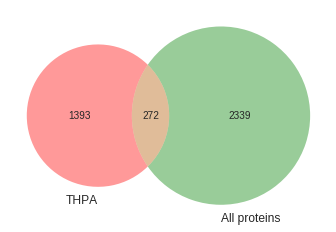

In [34]:
venn.venn2(subsets = (set(cancer_related_genes.index), set(preprocessor_cpu.named_steps.filtering.filtered_proteins)), set_labels=("THPA", "All proteins"))

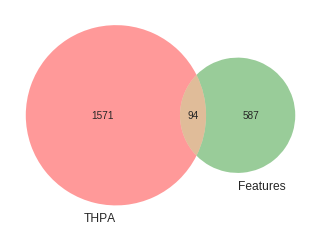

In [9]:
venn.venn2(subsets = (set(cancer_related_genes.index), set(features)), set_labels=("THPA", "Features"))

In [37]:
for prot in set(cancer_related_genes.index).intersection(set(features)):
    print(prot)

Q15059
Q6UN15
Q7Z6Z7
P16949
P02792
P05783
Q9Y5V3
P11388
Q86X55
P01023
P19838
P10644
P06756
Q14116
Q14676
P12931
P32780
P32119
P36507
P11166
Q8IVF2
P23229
Q01081
P15121
O14672
P35268
P04083
Q13451
P48735
P26038
P31947
Q9UBW7
P26447
Q01105
P17301
P36639
P21266
O75533
O14497
Q9BZQ8
Q00534
P46013
P11047
O75475
P12956
Q16658
Q13315
P62745
Q6P2Q9
Q9Y4H2
P29992
P51608
P61586
P78527
P42574
P19174
P29317
O76095
Q92598
Q9UBB5
Q96T58
P12277
Q02952
Q9BRP1
Q8N3U4
Q12797
P26006
Q5JTZ9
P17050
Q08380
P05787
P33552
P14923
Q14247
P31749
P08648
O60566
O75146
Q01831
P78356
Q9UQE7
Q15836
P16144
P17931
Q9HC35
Q14764
P54652
P07948
P27695
P06703
P19367
O15164
P15531
Q15149


In [31]:
print(94/(587+94))

0.13803230543318648


In [27]:
important_lr_features = []
important_svc_features = []
important_rf_features = []

for x in range(15):
    lr_sum = get_summary_df(x, shap_lr_train, hard_threshold=0.1)
    svc_sum = get_summary_df(x, shap_svc_train, thresholding = True)
    rf_sum = get_summary_df(x, shap_rf_train, thresholding = True)

    important_lr_features += lr_sum.index.tolist()
    important_svc_features += svc_sum.index.tolist()
    important_rf_features += rf_sum.index.tolist()

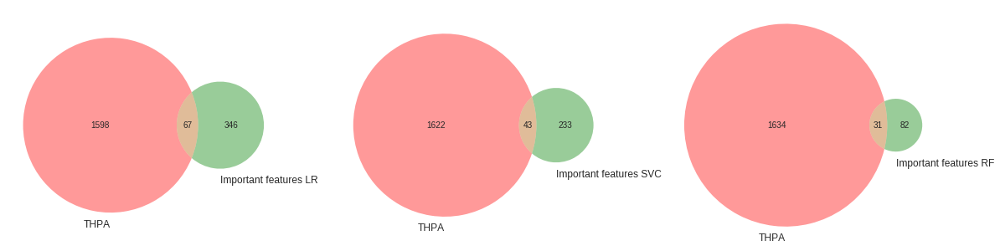

In [28]:
fig, ax = plt.subplots(1,3, figsize=(20,7))

venn.venn2(subsets = (set(cancer_related_genes.index), set(important_lr_features)), set_labels=("THPA", "Important features LR"),ax=ax[0])
venn.venn2(subsets = (set(cancer_related_genes.index), set(important_svc_features)), set_labels=("THPA", "Important features SVC"),ax=ax[1])
venn.venn2(subsets = (set(cancer_related_genes.index), set(important_rf_features)), set_labels=("THPA", "Important features RF"),ax=ax[2])

In [30]:
print(67/(67+346))
print(43/(43+233))
print(31/(31+82))

0.162227602905569
0.15579710144927536
0.2743362831858407


In [287]:
cancer_related_genes_intersection = list(set(cancer_related_genes.index).intersection(set(features)))
cancer_related_genes = cancer_related_genes.loc[cancer_related_genes_intersection,:]

In [288]:
cancer_related_genes.loc[:,prognostics] = cancer_related_genes.loc[:,prognostics].applymap(lambda x: False if x[:12] == "unprognostic" else x)

In [289]:
prognostics_dict = {}
for prot, row in (cancer_related_genes.loc[:,prognostics] != False).iterrows():
    prognostic_classes = row.index[row]
    
    if len(prognostic_classes) > 0:
        prognostics_dict[prot] = [x.split(" - ")[1] for x in prognostic_classes]

In [290]:
cancer_related_genes = cancer_related_genes.loc[:,~cancer_related_genes.columns.isin(prognostics)]

In [291]:
cancer_related_genes["Cell line expression cluster"].value_counts()

Cluster 60: Keratinocytes - Epithelial cell function            9
Cluster 19: Stomach & Colon cancer - Absorption                 6
Cluster 45: Non-specific - Cell proliferation                   5
Cluster 68: Kidney - Mixed function                             4
Cluster 53: Non-specific - mRNA processing                      4
Cluster 46: Non-specific - Unknown function                     4
Cluster 3: HUVEC & TIME - Signal transduction                   4
Cluster 48: Non-specific - RNA binding                          4
Cluster 12: Lymphoid cancers - Adaptive immune response         4
Cluster 58: Non-specific - Basic cellular processes             3
Cluster 65: Breast cancer - Unknown function                    3
Cluster 61: Liver - Metabolism                                  3
Cluster 38: Non-specific - mRNA processing                      3
Cluster 55: Non-specific - Unknown function                     3
Cluster 22: Rhabdoid cancers - Neuronal signaling               2
Cluster 25

In [292]:
unique_prognostics_classes = []
for val in prognostics_dict.values():
    for v in val:
        if v not in unique_prognostics_classes:
            unique_prognostics_classes.append(v)
unique_prognostics_classes

['Liver cancer',
 'Lung cancer',
 'Pancreatic cancer',
 'Renal cancer',
 'Ovarian cancer',
 'Urothelial cancer',
 'Colorectal cancer',
 'Cervical cancer',
 'Head and neck cancer',
 'Thyroid cancer',
 'Endometrial cancer',
 'Stomach cancer',
 'Breast cancer',
 'Melanoma',
 'Prostate cancer']

In [293]:
def map_thpaPrognostics_to_features(summary):

    prognostic_match = {target_encoder.inverse_transform([i])[0]: {p: [] for p in unique_prognostics_classes} for i in range(15)}

    for i in range(15):
        summary_prots = summary[i].index.tolist()
        
        for summary_prot in summary_prots:
            if summary_prot in prognostics_dict.keys():
                
                for c in prognostics_dict[summary_prot]:
                    prognostic_match[target_encoder.inverse_transform([i])[0]][c].append(summary_prot)

    return prognostic_match


In [294]:
summaries_rf = []
summaries_lr = []
summaries_svc = []


for i in range(15):
    summaries_rf.append(get_summary_df(i, shap_rf_train, thresholding=True, threshold_std=1.96, keep_only_enriched=True, hard_threshold=False))
    summaries_lr.append(get_summary_df(i, shap_lr_train, hard_threshold=.1, keep_only_enriched=True))
    summaries_svc.append(get_summary_df(i, shap_svc_train, thresholding=True, threshold_std=1.96, keep_only_enriched=True, hard_threshold=False))

In [295]:
svc_prognostics = map_thpaPrognostics_to_features(summaries_svc)
lr_prognostics = map_thpaPrognostics_to_features(summaries_lr_thresh)
rf_prognostics = map_thpaPrognostics_to_features(summaries_rf)

In [296]:
def parse_prognostics(p):
    prot_per_class = {c: [] for c in p.keys()} # Protein identifiers
    disease_per_class = {c: {} for c in p.keys()} # Disease biomarker counts
    
    for class_name, prog_dict in p.items():

        for cancer_type, prots in prog_dict.items():
            if len(prots) != 0:
                for prot in prots:
                    if prot not in prot_per_class[class_name]:
                        prot_per_class[class_name].append(prot)
                disease_per_class[class_name][cancer_type] = len(prots)

    fig, ax1 = plt.subplots(1,1)
    ax1.set_title("# Unique protein prognostics found")
    ax1.barh(y=list(prot_per_class.keys()), width=[len(x) for x in prot_per_class.values()])

    return prot_per_class, disease_per_class

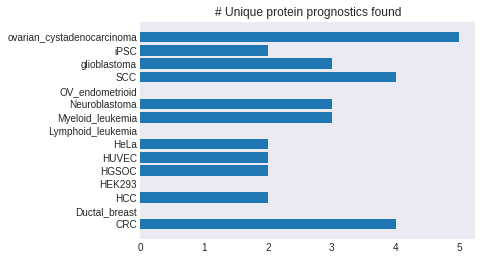

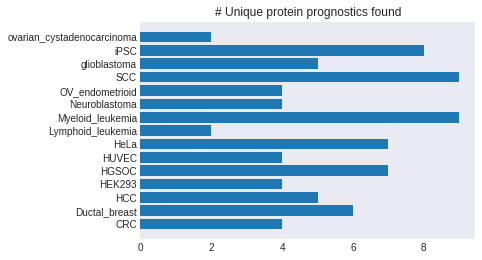

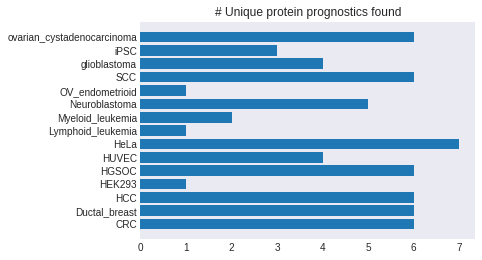

In [297]:
prognostics_svc, dpc_svc = parse_prognostics(svc_prognostics)
prognostics_lr, dpc_lr = parse_prognostics(lr_prognostics)
prognostics_rf, dpc_rf = parse_prognostics(rf_prognostics)

Let's sum the found prognostics for each model and confer importance when one is found by muliple models. Additionally, investigate in the ppi network to what they are linked

In [298]:
def sum_prognostics(lr, svc, rf):
    summed_prognostics_df = pd.DataFrame(columns=list(lr.keys()), index=list(prognostics_dict.keys()))

    for c in summed_prognostics_df.columns:
        prots = lr[c] + svc[c] + rf[c]

        for prot in set(prots):
            summed_prognostics_df.loc[prot,c] = prots.count(prot)
    
    return summed_prognostics_df

In [299]:
summed_prognostics_df = sum_prognostics(prognostics_lr, prognostics_svc, prognostics_rf)

In [300]:
summed_prognostics_df = summed_prognostics_df.dropna(axis=0, how="all")

In [70]:
summed_prognostics_df.fillna(0).to_csv("prognostics_string_colorfile.csv")

In [304]:
uniprot_description

,description
uniprot_id,
A0A024RBG1,Diphosphoinositol polyphosphate phosphohydrola...
A0A075B6H7,Probable non-functional immunoglobulin kappa v...
A0A075B6I1,Immunoglobulin lambda variable 4-60
A0A075B6I3,Probable non-functional immunoglobulin lambda ...
A0A075B6L6,Probable non-functional T cell receptor beta v...
...,...
Q9Y6Z4,Putative uncharacterized protein KIF25-AS1
Q9Y6Z5,Putative uncharacterized protein AFDN-DT
Q9Y6Z7,Collectin-10


In [307]:
pd.concat([summed_prognostics_df.loc[:,"CRC"].dropna(), uniprot_description], axis=1, join="inner")

,CRC,description
P33552,1,Cyclin-dependent kinases regulatory subunit 2
Q15149,1,Plectin
Q8IVF2,1,Protein AHNAK2
P31947,1,14-3-3 protein sigma
P17301,1,Integrin alpha-2
P15121,1,Aldo-keto reductase family 1 member B1
P16144,2,Integrin beta-4
P21266,1,Glutathione S-transferase Mu 3
Q08380,1,Galectin-3-binding protein
P23229,3,Integrin alpha-6


In [311]:
pd.concat([summed_prognostics_df.loc[:,"SCC"].dropna(), uniprot_description], axis=1, join="inner")

,SCC,description
P62745,1,Rho-related GTP-binding protein RhoB
P31947,3,14-3-3 protein sigma
P15531,1,Nucleoside diphosphate kinase A
P17301,1,Integrin alpha-2
P19838,1,Nuclear factor NF-kappa-B p105 subunit
P19174,1,"1-phosphatidylinositol 4,5-bisphosphate phosph..."
P14923,1,Junction plakoglobin
P16144,2,Integrin beta-4
Q9BZQ8,1,Protein Niban 1
P05783,1,"Keratin, type I cytoskeletal 18"


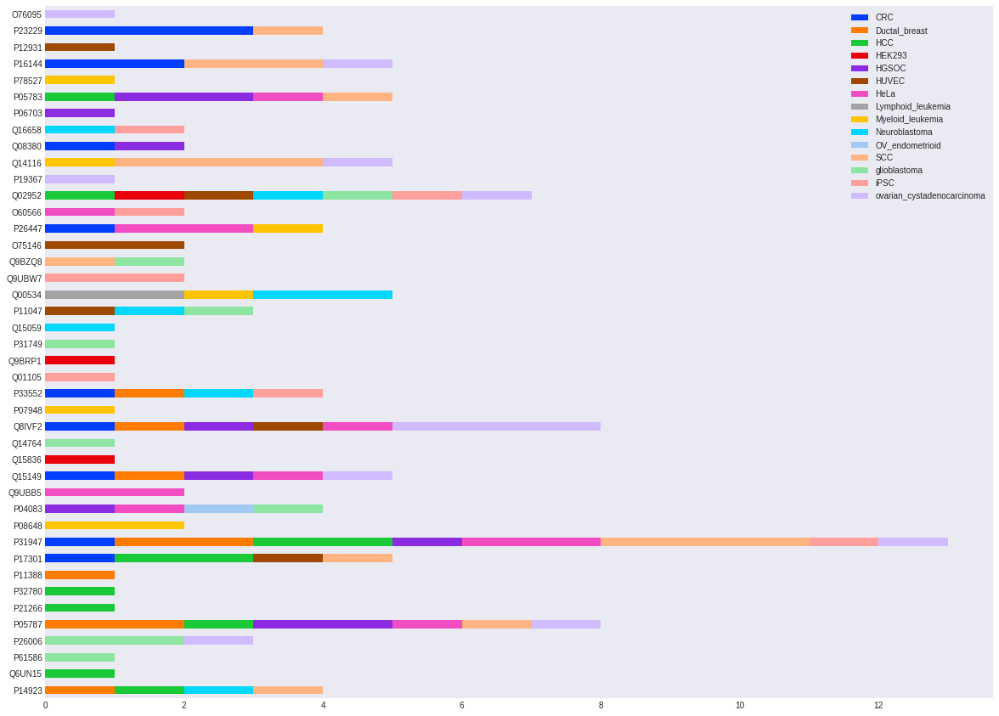

In [66]:
colors = sns.color_palette("bright")+sns.color_palette("pastel")
colors = colors[:15]
summed_prognostics_df.plot(kind="barh", stacked=True, figsize=[20,15],colors=colors, )

In [58]:
summed_prognostics_df.loc[summed_prognostics_df.loc[:,"CRC"].notna()]

,CRC,Ductal_breast,HCC,HEK293,HGSOC,HUVEC,HeLa,Lymphoid_leukemia,Myeloid_leukemia,Neuroblastoma,OV_endometrioid,SCC,glioblastoma,iPSC,ovarian_cystadenocarcinoma
P17301,1,NaN,2,NaN,NaN,1,NaN,NaN,NaN,NaN,NaN,1,NaN,NaN,NaN
P31947,1,2,2,NaN,1,NaN,2,NaN,NaN,NaN,NaN,3,NaN,1,1
Q15149,1,1,NaN,NaN,1,NaN,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1
Q8IVF2,1,1,NaN,NaN,1,1,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3
P33552,1,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,NaN,NaN,NaN,1,NaN
P26447,1,NaN,NaN,NaN,NaN,NaN,2,NaN,1,NaN,NaN,NaN,NaN,NaN,NaN
Q08380,1,NaN,NaN,NaN,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
P16144,2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2,NaN,NaN,1
P23229,3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,NaN,NaN,NaN


In [298]:
for keys, values in prognostics_lr.items():
    print(keys,values)

CRC ['P23229', 'P16144']
Ductal_breast ['P31947', 'P33552', 'P05787']
HCC ['Q6UN15', 'P32780', 'P21266']
HEK293 ['Q9BRP1', 'Q15836']
HGSOC ['P06703', 'P05783']
HUVEC ['O75146']
HeLa ['P26447', 'O60566', 'Q9UBB5']
Lymphoid_leukemia ['Q00534']
Myeloid_leukemia ['P08648', 'P07948']
Neuroblastoma []
OV_endometrioid []
SCC ['P31947', 'Q9BZQ8', 'P16144', 'Q14116']
glioblastoma ['P26006', 'Q9BZQ8']
iPSC ['O60566', 'Q01105', 'Q9UBW7']
ovarian_cystadenocarcinoma ['Q8IVF2']


In [299]:
for keys, values in prognostics_rf.items():
    print(keys,values)

CRC ['P23229', 'P31947', 'P33552', 'Q15149', 'Q8IVF2', 'P17301']
Ductal_breast ['P31947', 'P11388', 'Q15149', 'P14923', 'Q8IVF2', 'P05787']
HCC ['P31947', 'P14923', 'P17301', 'P05787', 'P05783', 'Q02952']
HEK293 ['Q02952']
HGSOC ['P31947', 'Q15149', 'Q8IVF2', 'P04083', 'P05787', 'P05783']
HUVEC ['P11047', 'Q8IVF2', 'P17301', 'Q02952']
HeLa ['P26447', 'P31947', 'Q15149', 'Q8IVF2', 'P04083', 'P05787', 'P05783']
Lymphoid_leukemia ['Q00534']
Myeloid_leukemia ['Q00534', 'P78527']
Neuroblastoma ['Q16658', 'P14923', 'Q00534', 'P11047', 'Q02952']
OV_endometrioid ['P04083']
SCC ['P23229', 'P31947', 'P17301', 'P05783', 'P05787', 'Q14116']
glioblastoma ['P26006', 'P11047', 'P04083', 'Q02952']
iPSC ['Q16658', 'P31947', 'Q02952']
ovarian_cystadenocarcinoma ['P31947', 'Q15149', 'Q8IVF2', 'P05787', 'Q02952', 'Q14116']


In [297]:
for keys, values in prognostics_svc.items():
    print(keys,values)

CRC ['P23229', 'P26447', 'Q08380', 'P16144']
Ductal_breast []
HCC ['P31947', 'P17301']
HEK293 []
HGSOC ['Q08380', 'P05787']
HUVEC ['P12931', 'O75146']
HeLa ['P31947', 'Q9UBB5']
Lymphoid_leukemia []
Myeloid_leukemia ['P08648', 'P26447', 'Q14116']
Neuroblastoma ['P33552', 'Q15059', 'Q00534']
OV_endometrioid []
SCC ['P31947', 'P14923', 'P16144', 'Q14116']
glioblastoma ['P61586', 'Q14764', 'P31749']
iPSC ['P33552', 'Q9UBW7']
ovarian_cystadenocarcinoma ['P26006', 'P19367', 'O76095', 'Q8IVF2', 'P16144']


In [300]:
for keys, values in dpc_lr.items():
    print(keys)
    for d, n in values.items():
        print(f"\t{d}: {n}")
    print()

CRC
	Head and neck cancer: 1
	Renal cancer: 1
	Pancreatic cancer: 1
	Lung cancer: 1

Ductal_breast
	Liver cancer: 2
	Renal cancer: 2
	Pancreatic cancer: 3
	Endometrial cancer: 1

HCC
	Liver cancer: 2
	Melanoma: 1

HEK293
	Liver cancer: 1
	Renal cancer: 2

HGSOC
	Urothelial cancer: 1
	Pancreatic cancer: 1
	Lung cancer: 1

HUVEC
	Renal cancer: 1
	Urothelial cancer: 1

HeLa
	Head and neck cancer: 1
	Liver cancer: 1
	Renal cancer: 1
	Pancreatic cancer: 1
	Lung cancer: 1
	Colorectal cancer: 1

Lymphoid_leukemia
	Urothelial cancer: 1
	Pancreatic cancer: 1

Myeloid_leukemia
	Cervical cancer: 1
	Head and neck cancer: 1
	Liver cancer: 1
	Renal cancer: 2
	Lung cancer: 1
	Thyroid cancer: 1
	Colorectal cancer: 1

Neuroblastoma

OV_endometrioid

SCC
	Liver cancer: 1
	Renal cancer: 1
	Urothelial cancer: 1
	Pancreatic cancer: 2
	Lung cancer: 1
	Endometrial cancer: 1
	Colorectal cancer: 1

glioblastoma
	Cervical cancer: 1
	Head and neck cancer: 1
	Urothelial cancer: 1
	Pancreatic cancer: 1

iPSC
	Live

In [301]:
for keys, values in dpc_rf.items():
    print(keys)
    for d, n in values.items():
        print(f"\t{d}: {n}")
    print()

CRC
	Head and neck cancer: 1
	Liver cancer: 2
	Renal cancer: 4
	Urothelial cancer: 1
	Pancreatic cancer: 4
	Lung cancer: 2
	Endometrial cancer: 1
	Colorectal cancer: 1

Ductal_breast
	Liver cancer: 2
	Renal cancer: 4
	Urothelial cancer: 1
	Pancreatic cancer: 4
	Lung cancer: 3
	Endometrial cancer: 1
	Colorectal cancer: 1

HCC
	Liver cancer: 1
	Renal cancer: 2
	Pancreatic cancer: 4
	Lung cancer: 2
	Endometrial cancer: 2

HEK293
	Lung cancer: 1
	Endometrial cancer: 1

HGSOC
	Liver cancer: 1
	Renal cancer: 2
	Urothelial cancer: 2
	Pancreatic cancer: 4
	Lung cancer: 3
	Thyroid cancer: 1
	Endometrial cancer: 2
	Colorectal cancer: 1

HUVEC
	Urothelial cancer: 2
	Pancreatic cancer: 2
	Lung cancer: 2
	Endometrial cancer: 1

HeLa
	Head and neck cancer: 1
	Liver cancer: 1
	Renal cancer: 3
	Urothelial cancer: 2
	Pancreatic cancer: 4
	Lung cancer: 3
	Thyroid cancer: 1
	Endometrial cancer: 2
	Colorectal cancer: 1

Lymphoid_leukemia
	Urothelial cancer: 1
	Pancreatic cancer: 1

Myeloid_leukemia
	Uroth

In [282]:
for keys, values in dpc_svc.items():
    print(keys)
    for d, n in values.items():
        print(f"\t{d}: {n}")
    print()

CRC
	Head and neck cancer: 2
	Renal cancer: 3
	Pancreatic cancer: 1
	Lung cancer: 1

Ductal_breast
	Stomach cancer: 1
	Renal cancer: 2
	Urothelial cancer: 1
	Endometrial cancer: 1

HCC
	Liver cancer: 1
	Renal cancer: 1
	Pancreatic cancer: 2
	Endometrial cancer: 1

HEK293

HGSOC
	Cervical cancer: 1
	Head and neck cancer: 1
	Liver cancer: 1
	Renal cancer: 2
	Pancreatic cancer: 1
	Lung cancer: 1
	Thyroid cancer: 1
	Colorectal cancer: 1

HUVEC
	Liver cancer: 2
	Renal cancer: 3
	Urothelial cancer: 2
	Pancreatic cancer: 1
	Lung cancer: 1
	Prostate cancer: 1

HeLa
	Liver cancer: 1
	Renal cancer: 1
	Pancreatic cancer: 1
	Endometrial cancer: 1
	Colorectal cancer: 1

Lymphoid_leukemia
	Cervical cancer: 1
	Head and neck cancer: 2
	Liver cancer: 2
	Renal cancer: 3
	Pancreatic cancer: 1
	Lung cancer: 3
	Thyroid cancer: 1
	Colorectal cancer: 1

Myeloid_leukemia
	Cervical cancer: 1
	Head and neck cancer: 2
	Liver cancer: 1
	Renal cancer: 2
	Lung cancer: 1
	Thyroid cancer: 1
	Colorectal cancer: 2

Neu